Students:

Joana Rodrigues - 20240603    
Maria Francisca - 20240346     
Rui Reis - 20240854      
Tomás Silva - 20230982     
Victor Pita - 20240596        

# Project Part 1 - Exploratory data analysis - Visualizations

This first part contains the exploratory data analysis of the dataset and most of the preprocessing done to the data (the preprocessing done before the split).

# Index 
1. [Imports](#imports)   
    1.1. [Import Libraries](#importlibraries)    
    1.2. [Import Data files](#importfiles)
2. [Data exploration and Preprocessing](#data)    
    2.1. [Dataset columns](#columns)    
    2.2. [Index & Duplicates](#index)     
    2.3. [Data types](#datatypes)   
    2.4. [Functions](#functions)       
    2.5. [1st Exploration: Univariate Distributions](#1stexploration)     
    2.6. [Feature Engineering](#newfeatures)    
    2.7. [Missing values](#missingvalues)     
    2.8. [Pickle exportation](#final)     
    2.9. [Univariate EDA: Categorical & Numerical](#categoricalnumerical)         
    2.10. [Multivariate EDA: Categorical & Numerical](#multivariateeda)                

`Accident Date` Injury date of the claim   
`Age at Injury Age` of injured worker when the injury occurred.  
`Alternative Dispute Resolution` Adjudication processes external to the Board.   
`Assembly Date` The date the claim was first assembled.   
`Attorney/ Representative` Is the claim being represented by an Attorney?   
`Average Weekly Wage ` The wage used to calculate workers’ compensation, disability, or an Paid Leave wage replacement benefits.      
`Birth Year` The reported year of birth of the injured worker.   
`C-2 Date` Date of receipt of the Employer's Report of Work-Related; Injury/Illness or equivalent (formerly Form C-2).   
`C-3 Date` Date Form C-3 (Employee Claim Form) was received.   
`Carrier Name`Name of primary insurance provider responsible for providing workers’ compensation coverage to the injured worker’s employer.   
`Carrier Type` Type of primary insurance provider responsible for providing workers’ compensation coverage.   
`Claim Identifier` Unique identifier for each claim, assigned by WCB.   
`County of Injury` Name of the New York County where the injury occurred.   
`COVID-19 Indicator` Indication that the claim may be associated with COVID-19.   
`District Name` Name of the WCB district office that oversees claims for that region or area of the state.   
`First Hearing Date` Date the first hearing was held on a claim at a WCB hearing location. A blank date means the claim has not yet had a hearing held.    
`Gender` The reported gender of the injured worker.   
`IME-4 Count` Number of IME-4 forms received per claim. The IME-4 form is the “Independent Examiner's Report of Independent Medical Examination” form.   
`Industry Code` NAICS code and descriptions are available at: https://www.naics.com/search-naics-codes-by-industry/.   
`Industry Code Description` 2-digit NAICS industry code description used to classify businesses according to their economic activity.   
`Medical Fee Region` Approximate region where the injured worker would receive medical service.   
`OIICS Nature of Injury Description` The OIICS nature of injury codes & descriptions are available at https://www.bls.gov/iif/oiics_manual_2007.pdf.   
`WCIO Cause of Injury Code` The WCIO cause of injury codes & descriptions are at https://www.wcio.org/Active%20PNC/WCIO_Cause_Table.pdf   
`WCIO Cause of Injury Description` See description of field above.    
`WCIO Nature of Injury Code` The WCIO nature of injury are available at https://www.wcio.org/Active%20PNC/WCIO_Nature_Table.pdf   
`WCIO Nature of Injury Description`See description of field above.   
`WCIO Part Of Body Code` The WCIO part of body codes & descriptions are available athttps://www.wcio.org/Active%20PNC/WCIO_Part_Table.pdf   
`WCIO Part Of Body Description` See description of field above.   
`Zip Code` The reported ZIP code of the injured worker’s home address.   
`Agreement Reached` Binary variable: Yes if there is an agreement without the involvement of the WCB -> unknown at the start of a claim.   
`WCB Decision` Multiclass variable: Decision of the WCB relative to the claim: “Accident” means that claim refers to workplace accident, “Occupational Disease” means illness from the workplace. -> requires WCB deliberation so it is unknown at start of claim.    
`Claim Injury Type` Main target variable: Deliberation of the WCB relative to benefits awarded to the claim. Numbering indicates severity   

<hr>
<a class="anchor" id="imports">
    
# 1. Import
</a>

<hr>
<a class="anchor" id="importlibraries">
    
## 1.1. Import libraries
</a>

In [2]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns
import warnings
import itertools
import math
import pickle
from sklearn.preprocessing import LabelEncoder
from math import ceil

In [3]:
warnings.filterwarnings('ignore')

<hr>
<a class="anchor" id="importfiles">
    
## 1.2. Import data files
</a>

In [4]:
df= pd.read_csv('sample_submission.csv')
df_train=pd.read_csv('train_data.csv')
df_test=pd.read_csv('test_data.csv')

<hr>
<a class="anchor" id="data">
    
# 2. Data exploration and Preprocessing
</a>

<hr>
<a class="anchor" id="columns">
    
## 2.1. Dataset columns
</a>

In [4]:
df_train.columns, df_test.columns

(Index(['Accident Date', 'Age at Injury', 'Alternative Dispute Resolution',
        'Assembly Date', 'Attorney/Representative', 'Average Weekly Wage',
        'Birth Year', 'C-2 Date', 'C-3 Date', 'Carrier Name', 'Carrier Type',
        'Claim Identifier', 'Claim Injury Type', 'County of Injury',
        'COVID-19 Indicator', 'District Name', 'First Hearing Date', 'Gender',
        'IME-4 Count', 'Industry Code', 'Industry Code Description',
        'Medical Fee Region', 'OIICS Nature of Injury Description',
        'WCIO Cause of Injury Code', 'WCIO Cause of Injury Description',
        'WCIO Nature of Injury Code', 'WCIO Nature of Injury Description',
        'WCIO Part Of Body Code', 'WCIO Part Of Body Description', 'Zip Code',
        'Agreement Reached', 'WCB Decision', 'Number of Dependents'],
       dtype='object'),
 Index(['Accident Date', 'Age at Injury', 'Alternative Dispute Resolution',
        'Assembly Date', 'Attorney/Representative', 'Average Weekly Wage',
        'Birth

In [5]:
pd.set_option('display.max_columns', None) # To view all the variables
df_train.describe(include='all')

,Accident Date,Age at Injury,Alternative Dispute Resolution,Assembly Date,Attorney/Representative,Average Weekly Wage,Birth Year,C-2 Date,C-3 Date,Carrier Name,Carrier Type,Claim Identifier,Claim Injury Type,County of Injury,COVID-19 Indicator,District Name,First Hearing Date,Gender,IME-4 Count,Industry Code,Industry Code Description,Medical Fee Region,OIICS Nature of Injury Description,WCIO Cause of Injury Code,WCIO Cause of Injury Description,WCIO Nature of Injury Code,WCIO Nature of Injury Description,WCIO Part Of Body Code,WCIO Part Of Body Description,Zip Code,Agreement Reached,WCB Decision,Number of Dependents
count,570337,574026.000000,574026,593471,574026,5.453750e+05,544948.000000,559466,187245,574026,574026,5.934710e+05,574026,574026,574026,574026,150798,574026,132803.000000,564068.000000,564068,574026,0.0,558386.000000,558386,558369.000000,558369,556944.000000,556944,545389,574026.000000,574026,574026.000000
unique,5539,NaN,3,1096,2,NaN,NaN,2475,1648,2046,8,NaN,8,63,2,8,1094,4,NaN,NaN,20,5,NaN,NaN,74,NaN,56,NaN,54,10060,NaN,1,NaN
top,2020-03-01,NaN,N,2020-03-06,N,NaN,NaN,2021-05-11,2021-04-21,STATE INSURANCE FUND,1A. PRIVATE,NaN,2. NON-COMP,SUFFOLK,N,NYC,2022-04-15,M,NaN,NaN,HEALTH CARE AND SOCIAL ASSISTANCE,IV,NaN,NaN,LIFTING,NaN,STRAIN OR TEAR,NaN,LOWER BACK AREA,11236,NaN,Not Work Related,NaN
freq,1245,NaN,571412,1422,392291,NaN,NaN,1847,350,111144,285368,NaN,291078,60430,546505,270779,440,335218,NaN,NaN,114339,265981,NaN,NaN,46610,NaN,153373,NaN,51862,3302,NaN,574026,NaN
mean,NaN,42.114270,NaN,NaN,NaN,4.910883e+02,1886.767604,NaN,NaN,NaN,NaN,2.366760e+07,NaN,NaN,NaN,NaN,NaN,NaN,3.207337,58.645305,NaN,NaN,NaN,54.381143,NaN,41.013839,NaN,39.738146,NaN,NaN,0.046665,NaN,3.006559
std,NaN,14.256432,NaN,NaN,NaN,6.092918e+03,414.644423,NaN,NaN,NaN,NaN,1.079271e+08,NaN,NaN,NaN,NaN,NaN,NaN,2.832303,19.644175,NaN,NaN,NaN,25.874281,NaN,22.207521,NaN,22.365940,NaN,NaN,0.210921,NaN,2.000801
min,NaN,0.000000,NaN,NaN,NaN,0.000000e+00,0.000000,NaN,NaN,NaN,NaN,5.393066e+06,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,11.000000,NaN,NaN,NaN,1.000000,NaN,1.000000,NaN,-9.000000,NaN,NaN,0.000000,NaN,0.000000
25%,NaN,31.000000,NaN,NaN,NaN,0.000000e+00,1965.000000,NaN,NaN,NaN,NaN,5.593414e+06,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,45.000000,NaN,NaN,NaN,31.000000,NaN,16.000000,NaN,33.000000,NaN,NaN,0.000000,NaN,1.000000
50%,NaN,42.000000,NaN,NaN,NaN,0.000000e+00,1977.000000,NaN,NaN,NaN,NaN,5.791212e+06,NaN,NaN,NaN,NaN,NaN,NaN,2.000000,61.000000,NaN,NaN,NaN,56.000000,NaN,49.000000,NaN,38.000000,NaN,NaN,0.000000,NaN,3.000000
75%,NaN,54.000000,NaN,NaN,NaN,8.410000e+02,1989.000000,NaN,NaN,NaN,NaN,5.991000e+06,NaN,NaN,NaN,NaN,NaN,NaN,4.000000,71.000000,NaN,NaN,NaN,75.000000,NaN,52.000000,NaN,53.000000,NaN,NaN,0.000000,NaN,5.000000


In [6]:
print("Únicas em df_train:", set(df_train.columns) - set(df_test.columns))

Únicas em df_train: {'Agreement Reached', 'WCB Decision', 'Claim Injury Type'}


<hr>
<a class="anchor" id="index">
    
## 2.2. Index & Duplicates
</a>

In [7]:
# To define the index as 'Claim Identifier' it has to be a column with only unique values
print(df_train['Claim Identifier'].nunique(), df_train['Claim Identifier'].count())
print(df_test['Claim Identifier'].count(), df_test['Claim Identifier'].nunique())

593470 593471
387975 387975


As each claim should have a specific number attributed, if thisnumber appears more than once it means there was an error. There can't be two claims with the same number.

In [8]:
# There is an identifier repeated in df_train therefore we want to see what this case is
# To Identify the duplicated Claim Identifiers we do:
duplicate_index_train = df_train[df_train.duplicated(subset='Claim Identifier', keep=False)]
duplicate_index_train

,Accident Date,Age at Injury,Alternative Dispute Resolution,Assembly Date,Attorney/Representative,Average Weekly Wage,Birth Year,C-2 Date,C-3 Date,Carrier Name,Carrier Type,Claim Identifier,Claim Injury Type,County of Injury,COVID-19 Indicator,District Name,First Hearing Date,Gender,IME-4 Count,Industry Code,Industry Code Description,Medical Fee Region,OIICS Nature of Injury Description,WCIO Cause of Injury Code,WCIO Cause of Injury Description,WCIO Nature of Injury Code,WCIO Nature of Injury Description,WCIO Part Of Body Code,WCIO Part Of Body Description,Zip Code,Agreement Reached,WCB Decision,Number of Dependents
257901,NaN,NaN,NaN,2021-05-21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,292668076,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
526445,NaN,NaN,NaN,2022-09-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,292668076,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
# As we previously saw this row doesn't contain any relevant information and is most likely an error therefore we can erase it
# Dropping the rows with those duplicate Claim Identifiers
df_train.drop(duplicate_index_train.index, inplace= True)

In [10]:
df_train.set_index('Claim Identifier', inplace=True)
df_test.set_index('Claim Identifier', inplace=True)

<hr>
<a class="anchor" id="datatypes">
    
## 2.3. Data types
</a>

In [11]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 593469 entries, 5393875 to 818961390
Data columns (total 32 columns):
 #   Column                              Non-Null Count   Dtype  
---  ------                              --------------   -----  
 0   Accident Date                       570337 non-null  object 
 1   Age at Injury                       574026 non-null  float64
 2   Alternative Dispute Resolution      574026 non-null  object 
 3   Assembly Date                       593469 non-null  object 
 4   Attorney/Representative             574026 non-null  object 
 5   Average Weekly Wage                 545375 non-null  float64
 6   Birth Year                          544948 non-null  float64
 7   C-2 Date                            559466 non-null  object 
 8   C-3 Date                            187245 non-null  object 
 9   Carrier Name                        574026 non-null  object 
 10  Carrier Type                        574026 non-null  object 
 11  Claim Injury Type     

Some data types are wrongly attributed. In this section we will put the dates to its right type and the Agreement Reached.

In [12]:
# It's said previously that agreement reached is a boolean, therefore we change its type
df_train['Agreement Reached']= df_train['Agreement Reached'].astype("boolean")

# Converting all the date columns into dates
df_train['Accident Date'] = pd.to_datetime(df_train['Accident Date'])
df_train['Assembly Date'] = pd.to_datetime(df_train['Assembly Date'])
df_train['C-2 Date'] = pd.to_datetime(df_train['C-2 Date'])
df_train['C-3 Date'] = pd.to_datetime(df_train['C-3 Date'])
df_train['First Hearing Date'] = pd.to_datetime(df_train['First Hearing Date'])
# train_data.info() to check

In [13]:
# Converting all the date columns into dates
df_test['Accident Date'] = pd.to_datetime(df_test['Accident Date'])
df_test['Assembly Date'] = pd.to_datetime(df_test['Assembly Date'])
df_test['C-2 Date'] = pd.to_datetime(df_test['C-2 Date'])
df_test['C-3 Date'] = pd.to_datetime(df_test['C-3 Date'])
df_test['First Hearing Date'] = pd.to_datetime(df_test['First Hearing Date'])

<hr>
<a class="anchor" id="functions">
    
## 2.4. Functions
</a>
Definition of a function to identify the features, dependently of their intrepretation and not on their actual type. for example some categorical are in numbers form but their meaning is categorical. This function, will be able to identify those.     
Furthermore, there is also the definition of functions for visualization purposes.

In [14]:
def identify_feature_types(df):
    # Identifying date features
    date_features = [column for column in df.columns if 'Date' in column]
    
    # Identifying categorical (object) features initially
    categorical_features = df.select_dtypes(include=['object']).columns.tolist()
    
    # Identifying boolean features
    boolean_features = df.select_dtypes(include=['bool']).columns.tolist()
    
    # Identifying numerical features (integers and floats), but excluding those with 'Code', 'County', or 'Carrier' in their name
    numerical_features = [
        column for column in df.select_dtypes(include=['int64', 'float64']).columns
        if 'Code' not in column and 'County' not in column and 'Carrier' not in column and 'Decision' not in column and 'Indicator' not in column  and 'Grouped' not in column
    ]
    
    # Adding features with 'Code', 'County', or 'Carrier' in the name to categorical features, even if they are numerical
    categorical_features.extend([
        column for column in df.columns if 'Code' in column or 'County' in column or 'Carrier' in column or 'Decision' in column or 'Indicator' in column or 'Grouped' in column
    ])

    # Removing duplicates in case any feature is accidentally added twice
    categorical_features = list(set(categorical_features))
    
    return {
        'date_features': date_features,
        'numerical_features': numerical_features,
        'categorical_features': categorical_features,
        'boolean_features': boolean_features
    }


def visualize_all_num_distributions(df, numerical_features, bins=30, kde=True):
    # Determining the grid size for an n x n layout
    num_features = len(numerical_features)
    grid_size = math.ceil(math.sqrt(num_features))  # Calculate n for an approximately square grid
    
    # Setting up the subplot grid
    fig, axes = plt.subplots(grid_size, grid_size, figsize=(5 * grid_size, 5 * grid_size))
    axes = axes.flatten()  # Flatten to easily index with numerical_features
    
    # Plotting each numerical feature in a separate subplot
    for i, column_name in enumerate(numerical_features):
        sns.histplot(df[column_name].dropna(), bins=bins, kde=kde, ax=axes[i])
        axes[i].set_title(f'Distribution of {column_name}')
        axes[i].set_xlabel(column_name)
        axes[i].set_ylabel('Frequency')
    
    # Removing any empty subplots if num_features is not a perfect square
    for j in range(i + 1, grid_size * grid_size):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()


def visualize_categorical_distributions(df, categorical_features):
    # Determining the grid size for an n x n layout
    num_features = len(categorical_features)
    grid_size = math.ceil(math.sqrt(num_features))  # Calculate n for an approximately square grid
    
    # Setting up the subplot grid
    fig, axes = plt.subplots(grid_size, grid_size, figsize=(5 * grid_size, 5 * grid_size))
    axes = axes.flatten()  # Flatten to easily index with categorical_features
    
    # Plotting each categorical feature in a separate subplot
    for i, column_name in enumerate(categorical_features):
        unique_values = df[column_name].nunique()
        
        if unique_values > 10:
            # Counting occurrences of each category
            value_counts = df[column_name].value_counts().sort_index()
            values = value_counts.index
            counts = value_counts.values
            
            # Normalizing unique values for color mapping
            norm = plt.Normalize(values.min(), values.max())
            colors = plt.cm.rainbow(norm(values))  # Use rainbow colormap based on feature values

            # Creating a bar plot with color mapping based on unique feature values
            bars = axes[i].bar(values, counts, color=colors)
            axes[i].set_title(f'Color-mapped Bar Plot of {column_name}')
            axes[i].set_xlabel(column_name)
            axes[i].set_ylabel('Count')
            
            # Adding a color bar on the side to show feature values mapping
            sm = plt.cm.ScalarMappable(cmap="rainbow", norm=norm)
            sm.set_array(values)
            fig.colorbar(sm, ax=axes[i], orientation="vertical", label=column_name)
        
        else:
            # For fewer than 10 unique values, use a regular count plot
            sns.countplot(x=df[column_name], ax=axes[i], palette="rainbow")
            axes[i].set_title(f'Distribution of {column_name}')
            axes[i].set_xlabel(column_name)
            axes[i].set_ylabel('Count')
            axes[i].tick_params(axis='x', rotation=45)  # Rotate x labels for readability

    # Removing any empty subplots if num_features is not a perfect square
    for j in range(i + 1, grid_size * grid_size):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()


def plot_kde_by_category(data, continuous_var, nominal_var):
 
    # Filtering out missing values for the continuous variable
    clean_data = data[data[continuous_var].notna()]
    max_value = clean_data[continuous_var].max()

    plt.figure(figsize=(8, 4))

    # Sorting the unique values of the nominal variable in ascending order
    sorted_categories = sorted(clean_data[nominal_var].dropna().unique())

    # Generating a color palette based on the number of unique categories
    unique_colors = sns.color_palette("husl", len(sorted_categories))

    # Plotting each category with its corresponding color, sorted by the nominal variable
    for idx, category in enumerate(sorted_categories):
        sns.kdeplot(clean_data[clean_data[nominal_var] == category][continuous_var], 
                    label=f'{nominal_var} {category}', 
                    linewidth=2, 
                    color=unique_colors[idx])

    plt.title(f'Distribution of {continuous_var} by {nominal_var} (Sorted Colors)')
    plt.xlabel(continuous_var.replace('_', ' ').capitalize())
    plt.ylabel('Density')
    plt.xlim(0, max_value)

    plt.legend(title=nominal_var.replace('_', ' ').capitalize(), bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.show()
    
def plot_kde_by_category_2(data, continuous_var, nominal_var, bw_adjust=1):
    clean_data = data[data[continuous_var].notna()]
    max_value = clean_data[continuous_var].max()

    plt.figure(figsize=(8, 4))

    # Sorting the unique values of the nominal variable in ascending order
    sorted_categories = sorted(clean_data[nominal_var].dropna().unique())

    unique_colors = sns.color_palette("husl", len(clean_data[nominal_var].unique()))

    # Plotting each category with its corresponding color, sorted by the nominal variable
    for idx, category in enumerate(sorted_categories):
        sns.kdeplot(clean_data[clean_data[nominal_var] == category][continuous_var], 
                    label=f'{nominal_var} {category}', 
                    linewidth=2, 
                    color=unique_colors[idx],
                    bw_adjust=bw_adjust)

  

    plt.title(f'Distribution of {continuous_var} by {nominal_var} (Sorted Colors)')
    plt.xlabel(continuous_var.replace('_', ' ').capitalize())
    plt.ylabel('Density')
    plt.xlim(0, max_value)

    plt.legend(title=nominal_var.replace('_', ' ').capitalize(), bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.show()


def plot_normalized_proportions_all(df, main_var, other_vars, title=None):
    # Filtering out the main_var from the list of other_vars if present
    other_vars = [var for var in other_vars if var != main_var]
    
    num_plots = len(other_vars)
    cols = math.ceil(math.sqrt(num_plots))
    rows = math.ceil(num_plots / cols)

    # Adjusting the figure size to make subplots bigger
    fig, axes = plt.subplots(rows, cols, figsize=(17 * cols, 10 * rows))
    fig_title = title if title else f"Normalized Proportion Plots for '{main_var}'"
    fig.suptitle(fig_title, fontsize=30, y=1.02)
    axes = axes.flatten()  # Flatten the axes array for easy iteration
    
    for i, other_var in enumerate(other_vars):
        # Normalizing counts
        normalized_counts = (
            df.groupby([main_var, other_var]).size() / df.groupby(main_var).size()
        ).reset_index(name='proportion')
        
        # Garantir que 'other_var' seja tratado como uma variável categórica ou string
        normalized_counts[other_var] = normalized_counts[other_var].astype(str)  # ou .astype('category')

        # Plotting on the current axis
        sns.barplot(
            x=main_var, 
            y='proportion', 
            hue=other_var, 
            data=normalized_counts, 
            ax=axes[i], 
            palette='viridis'
        )
        axes[i].set_title(f'{main_var} vs. {other_var} (Normalized)', fontsize=25)
        axes[i].set_xlabel(main_var, fontsize=20)
        axes[i].set_ylabel('Proportion', fontsize=20)
        axes[i].legend(title=other_var, bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=20, title_fontsize=20)
        axes[i].tick_params(axis='x', rotation=90, labelsize=20)
        axes[i].tick_params(axis='y', labelsize=20)
    
    # Turning off any extra subplots that aren't needed
    for j in range(i + 1, rows * cols):
        fig.delaxes(axes[j])
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)  # Adjusting layout to accommodate the main title
    plt.show()


<hr>
<a class="anchor" id="1stexploration">
    
## 2.5. 1st Exploration: Univariate Distributions
</a>

In [15]:
feature_types=identify_feature_types(df_train)

feature_types_test = identify_feature_types(df_test)

In [16]:
# Transforming categorical features with more than 10 unique values to integers, converting values to strings first
df_train_visuals = df_train.copy() # to guarantee there is no change directly in df_train to avoid data leakage and enconding before
df_train_visuals[feature_types['categorical_features']] = df_train[feature_types['categorical_features']].apply(
    lambda x: LabelEncoder().fit_transform(x.astype(str)) if x.nunique() > 10 else x)

In [17]:
# Transforming categorical features with more than 10 unique values to integers, converting values to strings first
df_test_visuals = df_test.copy()
df_test_visuals[feature_types_test['categorical_features']] = df_test[feature_types_test['categorical_features']].apply(
    lambda x: LabelEncoder().fit_transform(x.astype(str)) if x.nunique() > 10 else x)

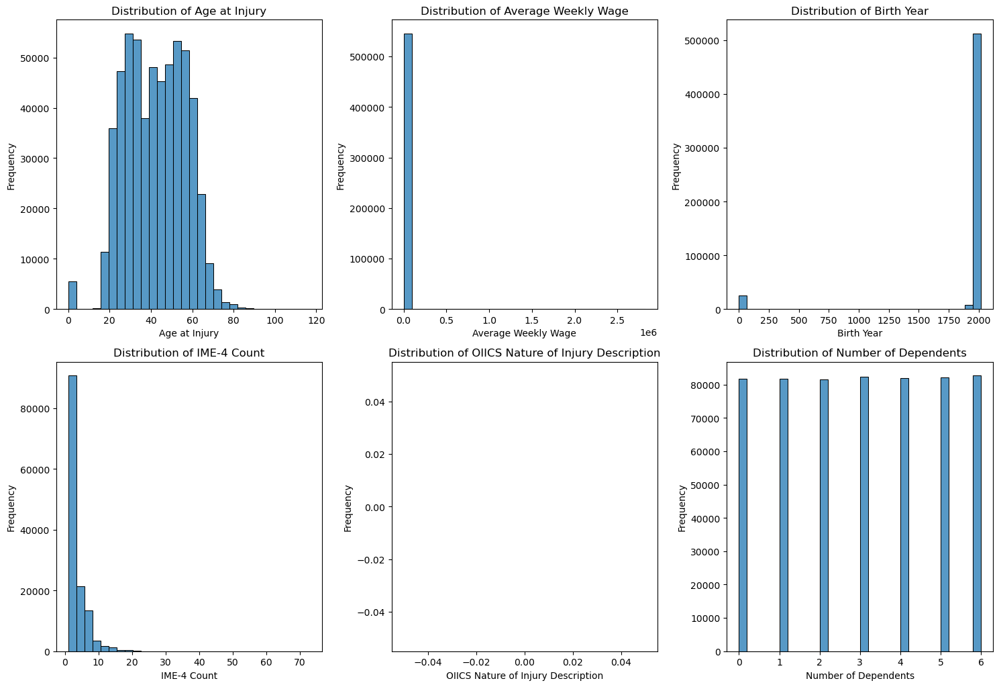

In [18]:
visualize_all_num_distributions(df=df_train_visuals, numerical_features=feature_types['numerical_features'],bins=30, kde=False)

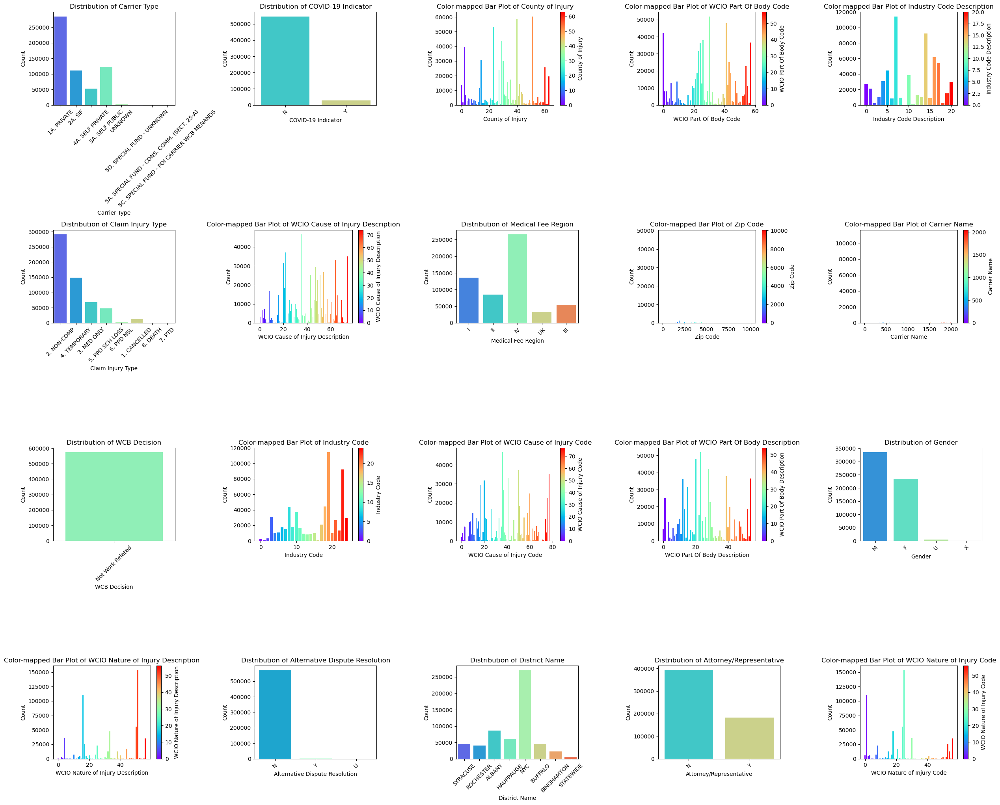

In [19]:
visualize_categorical_distributions(df_train_visuals,feature_types['categorical_features'])

## 2.6. Feature engineering
In this section we will remove some features that from our intrepretation can be excluded already (by intrepretation or high redundancy) and won't need to be included in feature selection.
We will also create some new features from the existing ones.

In [20]:
features = identify_feature_types(df_train)
categorical_features = features['categorical_features']

for col in categorical_features:
    print(col, df_train[col].unique())

Carrier Type ['1A. PRIVATE' nan '2A. SIF' '4A. SELF PRIVATE' '3A. SELF PUBLIC'
 'UNKNOWN' '5D. SPECIAL FUND - UNKNOWN'
 '5A. SPECIAL FUND - CONS. COMM. (SECT. 25-A)'
 '5C. SPECIAL FUND - POI CARRIER WCB MENANDS']
COVID-19 Indicator ['N' nan 'Y']
County of Injury ['ST. LAWRENCE' 'WYOMING' 'ORANGE' nan 'DUTCHESS' 'SUFFOLK' 'ONONDAGA'
 'RICHMOND' 'MONROE' 'KINGS' 'NEW YORK' 'QUEENS' 'WESTCHESTER' 'GREENE'
 'NASSAU' 'ALBANY' 'ERIE' 'BRONX' 'CAYUGA' 'NIAGARA' 'LIVINGSTON'
 'WASHINGTON' 'MADISON' 'WARREN' 'SENECA' 'GENESEE' 'SARATOGA'
 'CHAUTAUQUA' 'COLUMBIA' 'RENSSELAER' 'CATTARAUGUS' 'ROCKLAND' 'SCHUYLER'
 'BROOME' 'ULSTER' 'CLINTON' 'ONEIDA' 'UNKNOWN' 'MONTGOMERY' 'ONTARIO'
 'SCHENECTADY' 'CHEMUNG' 'YATES' 'HERKIMER' 'ALLEGANY' 'TIOGA' 'FULTON'
 'DELAWARE' 'TOMPKINS' 'PUTNAM' 'OSWEGO' 'LEWIS' 'ESSEX' 'OTSEGO'
 'CORTLAND' 'ORLEANS' 'SULLIVAN' 'CHENANGO' 'FRANKLIN' 'WAYNE' 'JEFFERSON'
 'STEUBEN' 'SCHOHARIE' 'HAMILTON']
WCIO Part Of Body Code [62. 38. 10. nan 36. 60. 14. 55. 53. 37. 42. 61. 

We may drop the "Description" columns since it doesn't bring anything new for us because the info is in code but firstly, we group some of the entries in column to see if this will work better for our model. The groups where made in terms of associations.     
We also drop Agreement reached as it only has 1 unique value therefore it doesn't have any valuable information.

In [21]:
# TO SEE THE COLUMNS
# description_columns = [col for col in df_test.columns if 'Description' in col]
# for col in description_columns:
#     print(col, df_train[col].unique())

In [22]:
industry_mapping = {"RETAIL TRADE": "Trade & Commerce", "WHOLESALE TRADE": "Trade & Commerce",
    "CONSTRUCTION": "Construction & Manufacturing", "HEALTH CARE AND SOCIAL ASSISTANCE": "Healthcare & Social Services",
    "EDUCATIONAL SERVICES": "Education & Information", "INFORMATION": "Education & Information",
    "TRANSPORTATION AND WAREHOUSING": "Transportation & Infrastructure", "UTILITIES": "Transportation & Infrastructure",
    "PUBLIC ADMINISTRATION": "Public Administration & Professional Services", "PROFESSIONAL, SCIENTIFIC, AND TECHNICAL SERVICES": "Public Administration & Professional Services", "ADMINISTRATIVE AND SUPPORT AND WASTE MANAGEMENT AND REMEDIAT": "Public Administration & Professional Services",
    "ACCOMMODATION AND FOOD SERVICES": "Leisure & Hospitality", "ARTS, ENTERTAINMENT, AND RECREATION": "Leisure & Hospitality",
    "FINANCE AND INSURANCE": "Finance & Real Estate", "REAL ESTATE AND RENTAL AND LEASING": "Finance & Real Estate",
    "AGRICULTURE, FORESTRY, FISHING AND HUNTING": "Natural Resources",
    "MINING": "Natural Resources",
    "OTHER SERVICES (EXCEPT PUBLIC ADMINISTRATION)": "Other Services",
    "MANAGEMENT OF COMPANIES AND ENTERPRISES": "Corporate Services"}

df_train["Industry Grouped"] = df_train["Industry Code Description"].map(industry_mapping)
df_test["Industry Grouped"] = df_test["Industry Code Description"].map(industry_mapping)

cause_groups = {"Physical Impact Injuries": ["FROM LIQUID OR GREASE SPILLS", "OBJECT BEING LIFTED OR HANDLED", "FALL, SLIP OR TRIP, NOC", 
        "CUT, PUNCTURE, SCRAPE, NOC", "STRUCK OR INJURED, NOC", "FALLING OR FLYING OBJECT", 
        "ON SAME LEVEL", "STATIONARY OBJECT", "FROM DIFFERENT LEVEL (ELEVATION)", "INTO OPENINGS", 
        "ON STAIRS", "FROM LADDER OR SCAFFOLDING", "SLIP, OR TRIP, DID NOT FALL", 
        "COLLISION OR SIDESWIPE WITH ANOTHER VEHICLE", "MOTOR VEHICLE, NOC"],
    "Repetitive Strain Injuries": ["REPETITIVE MOTION", "TWISTING", "LIFTING", "PUSHING OR PULLING", "REACHING"],
    "Environmental/Exposure Injuries": ["STEAM OR HOT FLUIDS", "ON ICE OR SNOW", "CHEMICALS", "DUST, GASES, FUMES OR VAPORS", 
        "ABSORPTION, INGESTION OR INHALATION, NOC", "COLD OBJECTS OR SUBSTANCES", "HOT OBJECTS OR SUBSTANCES", 
        "ELECTRICAL CURRENT", "FIRE OR FLAME", "TEMPERATURE EXTREMES", "RADIATION"],
    "Machinery or Tool-Related Injuries": ["MACHINE OR MACHINERY", "MOVING PARTS OF MACHINE", "USING TOOL OR MACHINERY", 
        "POWERED HAND TOOL, APPLIANCE", "HAND TOOL OR MACHINE IN USE"],
    "Vehicle-Related Injuries": ["VEHICLE UPSET", "CRASH OF RAIL VEHICLE", "CRASH OF WATER VEHICLE", "CRASH OF AIRPLANE"],
    "Other / Miscellaneous Causes": ["ANIMAL OR INSECT", "GUNSHOT", "PERSON IN ACT OF A CRIME", "TERRORISM", "PANDEMIC", 
        "NATURAL DISASTERS", "EXPLOSION OR FLARE BACK", "MOLD", "ABNORMAL AIR PRESSURE", 
        "CONTACT WITH, NOC", "SLIP, OR TRIP, DID NOT FALL"]}

cause_mapping = {cause: category for category, causes in cause_groups.items() for cause in causes}
df_train["WCIO Cause of Injury Grouped"] = df_train["WCIO Cause of Injury Description"].map(cause_mapping)
df_test["WCIO Cause of Injury Grouped"] = df_test["WCIO Cause of Injury Description"].map(cause_mapping)

nature_groups = {"Soft Tissue & Strains": ["CONTUSION", "SPRAIN OR TEAR", "STRAIN OR TEAR", "INFLAMMATION", "LACERATION"],
    "Fractures & Bone Injuries": ["FRACTURE", "DISLOCATION", "RUPTURE", "HERNIA"],
    "Diseases": ["ALL OTHER OCCUPATIONAL DISEASE INJURY, NOC", "CARPAL TUNNEL SYNDROME", "NO PHYSICAL INJURY", 
        "INFECTION", "RESPIRATORY DISORDERS", "MENTAL DISORDER", "CONTAGIOUS DISEASE", "CANCER", "HEAT PROSTRATION", "AIDS", "ASBESTOSIS", 
        "HEPATITIS C", "POISONING - METAL", "BYSSINOSIS", "POISONING - GENERAL (NOT OD OR CUMULATIVE)", "POISONING - CHEMICAL, (OTHER THAN METALS)"],
    "Mental & Psychological Injuries": ["MENTAL STRESS", "SYNCOPE"],
    "Trauma and Physical Injuries": ["AMPUTATION", "CRUSHING", "ELECTRIC SHOCK", "ENUCLEATION"],
    "Exposure and Environmental Injuries": ["DERMATITIS", "ASPHYXIATION", "FREEZING", "RADIATION", "BLACK LUNG", "VDT - RELATED DISEASES", "MOLD"],
    "Multiple and Complex Injuries": ["VISION LOSS", "MULTIPLE PHYSICAL INJURIES ONLY", "MULTIPLE INJURIES INCLUDING BOTH PHYSICAL AND PSYCHOLOGICAL", "LOSS OF HEARING"],
    "Other": ["ADVERSE REACTION TO A VACCINATION OR INOCULATION", "NAN"]}

nature_mapping = {nature: category for category, nature in nature_groups.items() for nature in nature}
df_train["WCIO Nature of Injury Grouped"] = df_train["WCIO Nature of Injury Description"].map(nature_mapping)
df_test["WCIO Nature of Injury Grouped"] = df_test["WCIO Nature of Injury Description"].map(nature_mapping)

body_groups = {"Head and Neck": ['MULTIPLE HEAD INJURY', 'SKULL', 'BRAIN', 'FACIAL BONES', 'TEETH', 'EYE(S)', 'MOUTH', 
        'EAR(S)', 'NOSE', 'LARYNX', 'TRACHEA', 'MULTIPLE NECK INJURY'],
    "Upper Body": ['SHOULDER(S)', 'UPPER ARM', 'LOWER ARM', 'HAND', 'FINGER(S)', 'THUMB', 'WRIST', 'ELBOW', 
        'CHEST', 'ABDOMEN INCLUDING GROIN'],
    "Spinal Cord & Vertebrae": ['SPINAL CORD', 'VERTEBRAE', 'LUMBAR & OR SACRAL VERTEBRAE (VERTEBRA)', 'DISC'],
    "Lower Body": ['ANKLE', 'KNEE', 'LOWER LEG', 'HIP', 'FOOT', 'TOES', 'GREAT TOE', 'UPPER LEG', 
        'LOWER BACK AREA', 'UPPER BACK AREA'],
    "Internal Organs": ['INTERNAL ORGANS', 'HEART', 'LUNGS'],
    "Multiple Body Parts": ['MULTIPLE UPPER EXTREMITIES', 'MULTIPLE LOWER EXTREMITIES', 'MULTIPLE', 
        'MULTIPLE BODY PARTS (INCLUDING BODY)', 'BODY SYSTEMS AND MULTIPLE BODY SYSTEMS', 'WHOLE BODY'],
    "Other / Unclassified": ['BUTTOCKS', 'SOFT TISSUE', 'NO PHYSICAL INJURY', 
        'INSUFFICIENT INFO TO PROPERLY IDENTIFY - UNCLASSIFIED', 'ARTIFICIAL APPLIANCE'],
    "Pelvis Area": ['PELVIS', 'SACRUM AND COCCYX']}

body_mapping = {part: category for category, parts in body_groups.items() for part in parts}
df_train["WCIO Part of Body Grouped"] = df_train["WCIO Part Of Body Description"].map(body_mapping)
df_test["WCIO Part of Body Grouped"] = df_test["WCIO Part Of Body Description"].map(body_mapping)


In [23]:
df_train = df_train.drop(columns=[col for col in df_train.columns if 'Description' in col])
df_test = df_test.drop(columns=[col for col in df_test.columns if 'Description' in col])

df_train.drop(columns=['WCB Decision'], inplace= True) # Only has one value and was understood that the nan are when other rows are nan as well so it won't have any relevant information.
# Initially, we created a column that would indicate if this was nan or not but as, after the cleaning this column only had one value, (not nan), we will remove this

Creation of log columns for Average Weekly wage and IME-4 Count as this might work better for the model due to their high skewness.

In [24]:
df_train['log Average Weekly Wage'] = np.log(df_train['Average Weekly Wage'] + 1)
df_train['Log IME-4 Count'] = np.log(df_train['IME-4 Count'] + 1)
df_test['log Average Weekly Wage'] = np.log(df_test['Average Weekly Wage']+1)
df_test['Log IME-4 Count'] = np.log(df_test['IME-4 Count']+1)

For each date column we calculate the difference between the accident date and the column, so that we have the amount of days it took to get to the next stages.
In some cases when this difference is smaller than 0, that means that there was an error made because, for example the assembly date can't be before the accident. In this cases, we put it to 0. As the missing values might have some meaning we also create a binary column that indicates whether they were missing or not. For example, in First Hearing Date means the hearing hasnt happened.

In [25]:
columns = ['C-2 Date', 'C-3 Date', 'First Hearing Date', 'Assembly Date']

for col in columns:
    days_col = col.replace('Date', 'Days')
    binary_col = f'{col} Binary'

    # Binary column indicating whether the date exists
    df_train[binary_col] = df_train[col].notna()
    df_test[binary_col] = df_test[col].notna()

    # Days column: difference between the date and 'Accident Date'
    df_train[days_col] = (df_train[col] - df_train['Accident Date']).dt.days
    df_train[days_col] = df_train[days_col].clip(lower=0)

    df_test[days_col] = (df_test[col] - df_test['Accident Date']).dt.days
    df_test[days_col] = df_test[days_col].clip(lower=0)

    # Log transformation of the days column
    log_col = f'Log {days_col}'
    df_train[log_col] = np.log(df_train[days_col] + 1)
    df_test[log_col] = np.log(df_test[days_col] + 1)


From the accident date we take out the day, month, year and the day of the week to see if it will have any pattern that our model can identify as useful.
For example, specific months of the year being more likely to have deaths.

In [26]:
df_train['Day of Week'] = df_train['Accident Date'].dt.dayofweek # Day of the week (0=Monday, 6=Sunday)
df_train['Day of Month'] = df_train['Accident Date'].dt.day # Day of the month
df_train['Month'] = df_train['Accident Date'].dt.month # Month
df_train['Year'] = df_train['Accident Date'].dt.year # Year

df_test['Day of Week'] = df_test['Accident Date'].dt.dayofweek # Day of the week (0=Monday, 6=Sunday)
df_test['Day of Month'] = df_test['Accident Date'].dt.day # Day of the month
df_test['Month'] = df_test['Accident Date'].dt.month # Month
df_test['Year'] = df_test['Accident Date'].dt.year # Year

<hr>
<a class="anchor" id="missingvalues">
    
## 2.7. Missing Values
</a>

To see the missing values we use the following code

In [27]:
missing_values = pd.concat([df_train.isnull().sum(), 100 * df_train.isnull().mean()], axis=1)
missing_values.columns = ['Total', 'Percentage']
missing_values.sort_values(by=['Total', 'Percentage'], ascending=False, inplace=True)
missing_values.T

,IME-4 Count,Log IME-4 Count,First Hearing Days,Log First Hearing Days,First Hearing Date,C-3 Days,Log C-3 Days,C-3 Date,WCIO Cause of Injury Grouped,WCIO Nature of Injury Grouped,Industry Grouped,WCIO Part of Body Grouped,Birth Year,Average Weekly Wage,log Average Weekly Wage,Zip Code,WCIO Part Of Body Code,C-2 Days,Log C-2 Days,WCIO Nature of Injury Code,WCIO Cause of Injury Code,C-2 Date,Industry Code,Accident Date,Assembly Days,Log Assembly Days,Day of Week,Day of Month,Month,Year,Age at Injury,Alternative Dispute Resolution,Attorney/Representative,Carrier Name,Carrier Type,Claim Injury Type,County of Injury,COVID-19 Indicator,District Name,Gender,Medical Fee Region,Agreement Reached,Number of Dependents,Assembly Date,C-2 Date Binary,C-3 Date Binary,First Hearing Date Binary,Assembly Date Binary
Total,460666.000000,460666.000000,444122.000000,444122.000000,442671.000000,409671.00000,409671.00000,406224.000000,194860.000000,141046.000000,67551.000000,65506.000000,48521.000000,48094.000000,48094.000000,48080.000000,36525.000000,36123.000000,36123.000000,35100.000000,35083.000000,34003.000000,29401.000000,23132.00000,23132.00000,23132.00000,23132.00000,23132.00000,23132.00000,23132.00000,19443.000000,19443.000000,19443.000000,19443.000000,19443.000000,19443.000000,19443.000000,19443.000000,19443.000000,19443.000000,19443.000000,19443.000000,19443.000000,0.0,0.0,0.0,0.0,0.0
Percentage,77.622589,77.622589,74.834911,74.834911,74.590417,69.02989,69.02989,68.449068,32.834065,23.766364,11.382397,11.037813,8.175827,8.103877,8.103877,8.101518,6.154492,6.086754,6.086754,5.914378,5.911513,5.729533,4.954092,3.89776,3.89776,3.89776,3.89776,3.89776,3.89776,3.89776,3.276161,3.276161,3.276161,3.276161,3.276161,3.276161,3.276161,3.276161,3.276161,3.276161,3.276161,3.276161,3.276161,0.0,0.0,0.0,0.0,0.0


As we are doing a model to predict the column 'Claim Injury Type', if this column has a missing value it can't help the predicitions in our model. Therefore we drop all the rows that have missing values in 'Claim Injury Type' 

In [28]:
# Filtering the DataFrame to keep only the rows where 'Claim Injury Type' is not NaN
df_train = df_train[~df_train['Claim Injury Type'].isna()]

As there are some rows with a lot of missing values that would be completely biased if filled, we decided to define a threshold of rows being drop if they contain less than 20% of the total information

In [29]:
# There are rows with only 2 values, like the one where the index that was repeated
# These rows should be erased as they dont give any valuable information
# We decide that rows with less than 20% of information should be erased
df_train = df_train.dropna(thresh=int(df_train.shape[1] * 0.2))

IME-4 count    
Dropping this column as there are more than 70% of missing values and keeping it would lead to it being completely biased.
But we create a binary column that has the information about whether the value was missing or not, in case the missing is not random and can help the model.

In [30]:
df_train['IME-4 Count Binary nan'] = df_train['IME-4 Count'].isna().astype(int)
df_test['IME-4 Count Binary nan'] = df_test['IME-4 Count'].isna().astype(int)
df_train.drop(columns=['IME-4 Count', 'Log IME-4 Count'], inplace = True)
df_test.drop(columns =['IME-4 Count', 'Log IME-4 Count'], inplace = True)

Age columns        
In some columns the age is missing or is 0 and there is info of the birth year. In this cases we will substitute the 0 with the accident date minus the birth year because it gives us the age the person has when they had an accident.   
Furthermore, it is ilegal for people under 14 to be working in the United states therefore we erase the remaining rows where the person seems to be younge than 14 (we only do this for the df_train as we can't erase the rows in df_test since they all have to be predicted).   
In terms of age, we also defined a threshold of people being younger than 85 as older than this is not usual and can be an error or, if not it can be considered an outlier as it is not representative of our data.

In [31]:
# Looking through the missing values of the columns of dates
# Substituting the age with the date of the dataset - their birth year to correct this
df_train.loc[(df_train['Age at Injury'] == 0) & (df_train['Birth Year'] != 0) &  (df_train['Accident Date'].notna()), 'Age at Injury'] = df_train['Accident Date'].dt.year - df_train['Birth Year']
df_test.loc[(df_train['Age at Injury'] == 0) & (df_test['Birth Year'] != 0) &  (df_test['Accident Date'].notna()), 'Age at Injury'] = df_test['Accident Date'].dt.year - df_test['Birth Year']

# In New york the legal age to start working is 14, so if the people in the dataset are not 14 yet, we erase these rows.
df_train.drop(df_train[df_train['Age at Injury'] < 14].index, inplace=True)

# We decided to drop individuals older than 85 through the analysis of the boxplots.
df_train.drop(df_train[df_train['Age at Injury'] > 85].index, inplace=True) # We chose 85 years old as the cutoff for ‘Age at Injury’ because volunteers can typically be older than regular workers. This higher threshold ensures we include these older volunteers in our analysis, while still removing extreme outliers.

# We can erase birth year as it has the same information as age at injury


Dates' columns     
First to confirm if the values are attributed correctly, the birth year should be before the accident date.

In [32]:
count_rows = df_train[df_train['Birth Year'] > df_train['Accident Date'].dt.year].shape[0]
print(f"Number of rows where 'Birth Year' is greater than the year of 'Accident Date': {count_rows}")

Number of rows where 'Birth Year' is greater than the year of 'Accident Date': 0


We fill the columns of log days with 0 when they have missing values as the lack of value is not missing completely at random but actually has the meaning that the specific event hasnt happened yet.

In [33]:
# List of columns to fill missing values with 0
columns_to_fill = ['Log C-2 Days', 'Log C-3 Days', 'Log First Hearing Days', 'Log Assembly Days']

# Iterate through the list of columns and fill missing values with 0
for column in columns_to_fill:
    df_train[column].fillna(0, inplace=True)
    df_test[column].fillna(0, inplace= True)

 We will delete all "Date" and "Day" features, since we can work directly with the transformed Log day features.
 Assembly Date Binary is also erased because Assembly Date doesnt have any missing value therefore this column has a unique value

In [34]:
df_train.drop(columns =[ 'C-2 Date','C-2 Days','C-3 Date','C-3 Days','First Hearing Date','First Hearing Days','Assembly Days', 'Assembly Date',  'Accident Date', 'Birth Year', 'Average Weekly Wage', 'Assembly Date Binary'], inplace = True)
df_test.drop(columns =[ 'C-2 Date','C-2 Days','C-3 Date','C-3 Days','First Hearing Date','First Hearing Days','Assembly Days', 'Assembly Date', 'Accident Date', 'Birth Year', 'Average Weekly Wage', 'Assembly Date Binary'], inplace= True)

The columns 'COVID-19 Indicator' and 'Attorney/Representative' have 2 unique values therefore we transform them into boolean columns.

In [35]:
# Transforming the columns with 2 instances into binary columns, where 1 means yes and 0 no
df_train['COVID-19 Indicator'] = df_train['COVID-19 Indicator'].map({'Y': 1, 'N': 0})
df_test['COVID-19 Indicator'] = df_test['COVID-19 Indicator'].map({'Y': 1, 'N': 0})
df_train['Attorney/Representative'] = df_train['Attorney/Representative'].map({'Y': 1, 'N': 0})
df_test['Attorney/Representative'] = df_test['Attorney/Representative'].map({'Y': 1, 'N': 0})

We will assume that for these two columns, the missing values are 0 because if it is not given the information, it makes sense that they didn't have covid as this is more likely and that they didnt have an attorney.

In [36]:
df_train['Attorney/Representative'] = df_train['Attorney/Representative'].fillna(0)
df_test['Attorney/Representative'] = df_test['Attorney/Representative'].fillna(0)
df_train['COVID-19 Indicator'] = df_train['COVID-19 Indicator'].fillna(0)
df_test['COVID-19 Indicator'] = df_test['COVID-19 Indicator'].fillna(0)

<hr>
<a class="anchor" id="final">
    
## 2.8. Dataset for export
</a>
After the initial preprocessing, we will export a pickle with the datasets cleaned to be used in the following notebooks. 


#### Turn dataset into pickle

In [37]:
pickle.dump(df_train, open("df_train_cleaned.pkl", 'wb'))
pickle.dump(df_test, open("df_test_cleaned.pkl", 'wb'))

In [38]:
value_counts = df_train['Claim Injury Type'].value_counts()
percentages = df_train['Claim Injury Type'].value_counts(normalize=True) * 100

# Combine counts and percentages into a DataFrame
value_summary = pd.DataFrame({
    'Count': value_counts,
    'Percentage (%)': percentages
})

print(value_summary)



                    Count  Percentage (%)
Claim Injury Type                        
2. NON-COMP        287984       50.673395
4. TEMPORARY       147911       26.026281
3. MED ONLY         68640       12.077830
5. PPD SCH LOSS     48248        8.489673
1. CANCELLED        10761        1.893495
6. PPD NSL           4207        0.740260
8. DEATH              466        0.081997
7. PTD                 97        0.017068


<hr>
<a class="anchor" id="categoricalnumerical">
    
## 2.9. Univariate EDA: Categorical & Numerical
</a>

In this section, we will alterate some columns purely for visual purposes.
These alterations are not considered in the next notebook as they have data leakage (purely for understanding and visualizations)

In [39]:
df_train_visuals = df_train.copy()

In [40]:
# Identify feature types
feature_types = identify_feature_types(df_train_visuals)

# Fill missing values for numerical features
numerical_features = [col for col in feature_types['numerical_features']]
for column in numerical_features:
    if column in df_train_visuals.columns:
        avg_value = df_train_visuals[column].mean()
        df_train_visuals[column] = df_train_visuals[column].fillna(avg_value)

# Fill missing values for categorical features
categorical_features = [col for col in feature_types['categorical_features'] if col != 'Claim Injury Type']
for column in categorical_features:
    if column in df_train_visuals.columns:
        mode_value = df_train_visuals[column].mode()[0]
        df_train_visuals[column] = df_train_visuals[column].fillna(mode_value)

df_train_visuals[feature_types['categorical_features']] = df_train_visuals[feature_types['categorical_features']].apply(
    lambda x: LabelEncoder().fit_transform(x.astype(str)) if x.nunique() > 10 else x)

In [41]:
feature_types_cleaned = identify_feature_types(df_train)

<hr>
<a class="anchor" id="categoricaldistributions">
    
## 2.9.1. Categorical - Distributions
</a>

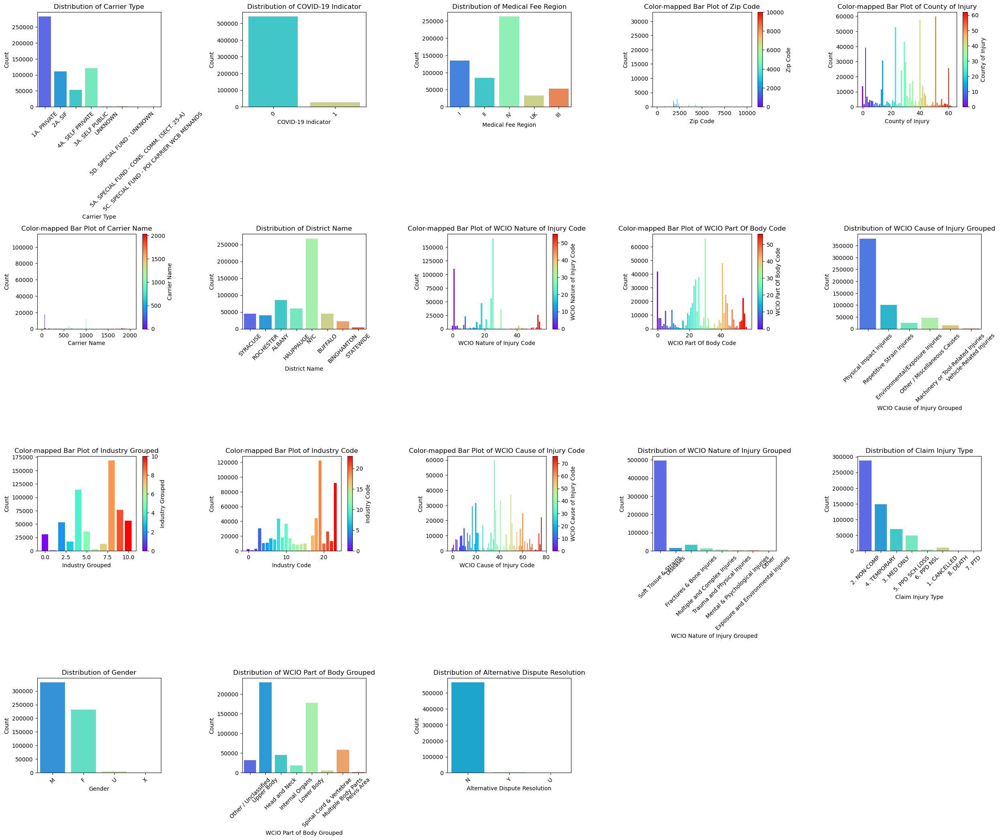

In [42]:
visualize_categorical_distributions(df_train_visuals,feature_types_cleaned['categorical_features'])

<hr>
<a class="anchor" id="numericaldistributions">
    
## 2.9.2. Numerical - Distributions
</a>

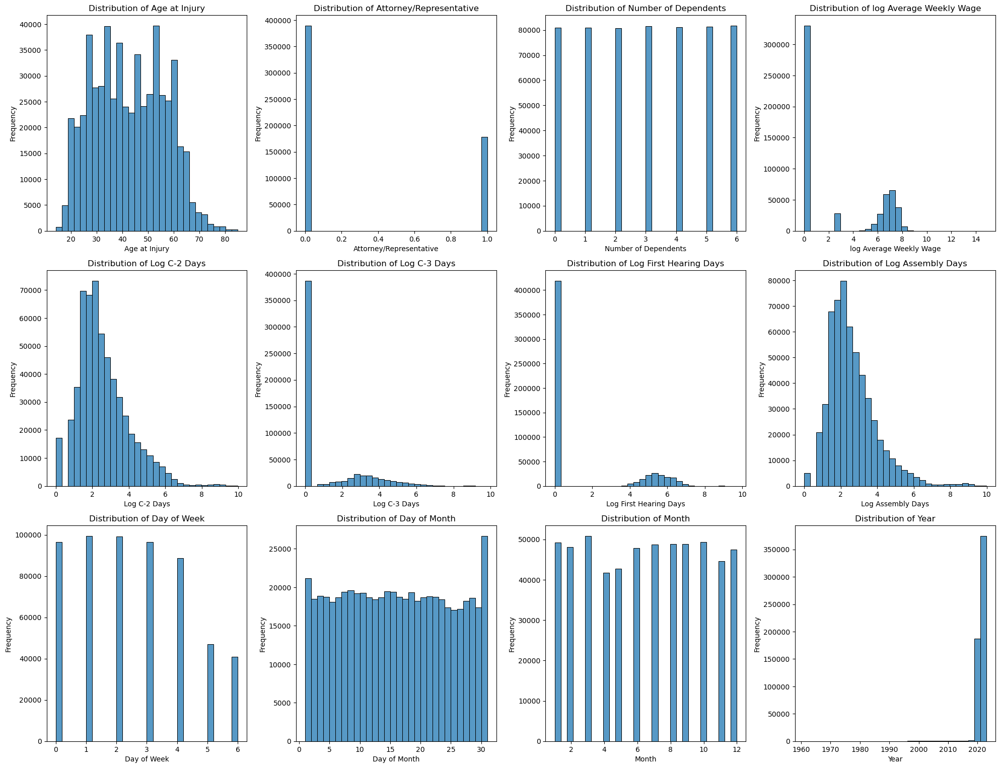

In [43]:
visualize_all_num_distributions(df=df_train_visuals, numerical_features=feature_types_cleaned['numerical_features'],bins=30, kde=False)

<hr>
<a class="anchor" id="multivariateeda">
    
## 2.10. Multivariate EDA: Categorical & Numerical
</a>

<hr>
<a class="anchor" id="kdeplots">
    
## 2.10.1. Numerical - Categorical - KDE Plots
</a>

In [44]:
small_category = df_train_visuals[[col for col in feature_types_cleaned['categorical_features'] if df_train_visuals[col].nunique() <= 10]]

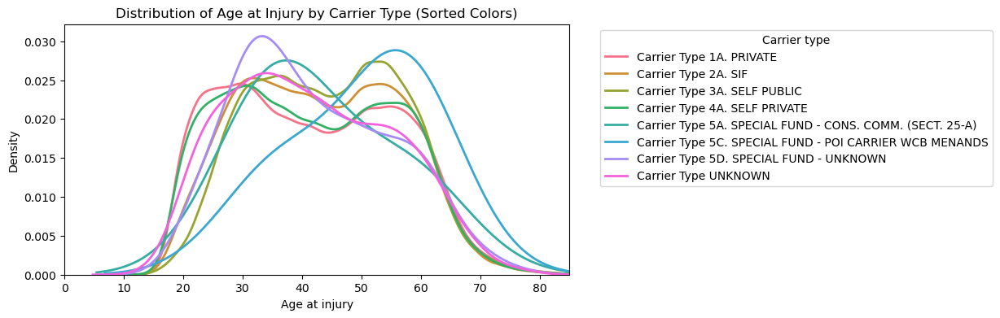

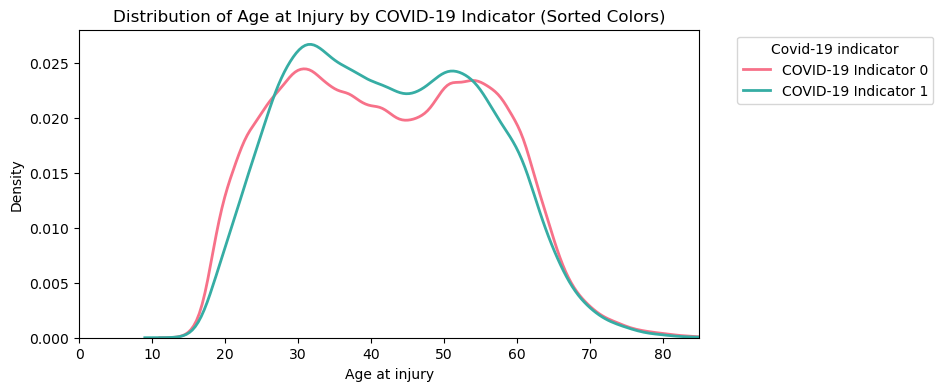

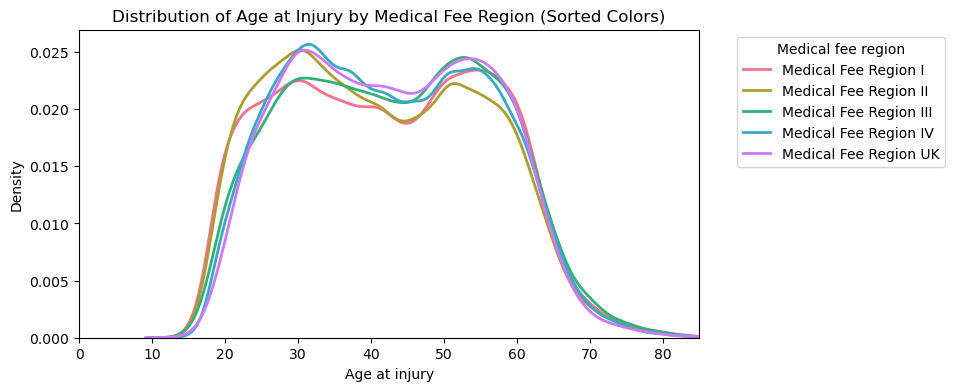

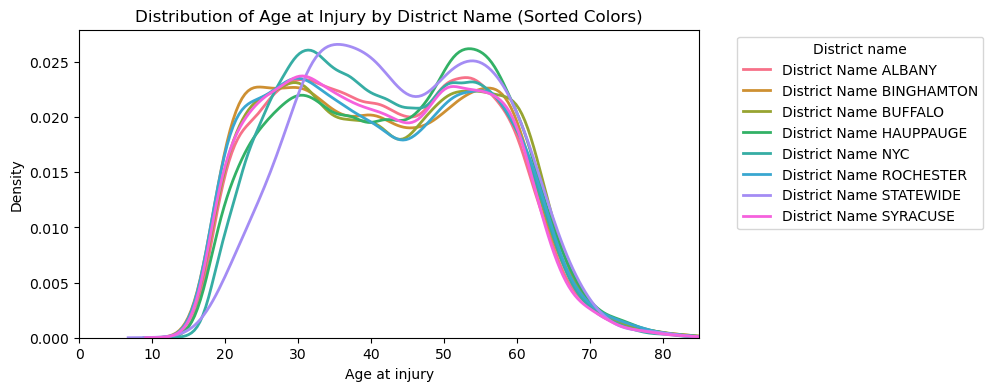

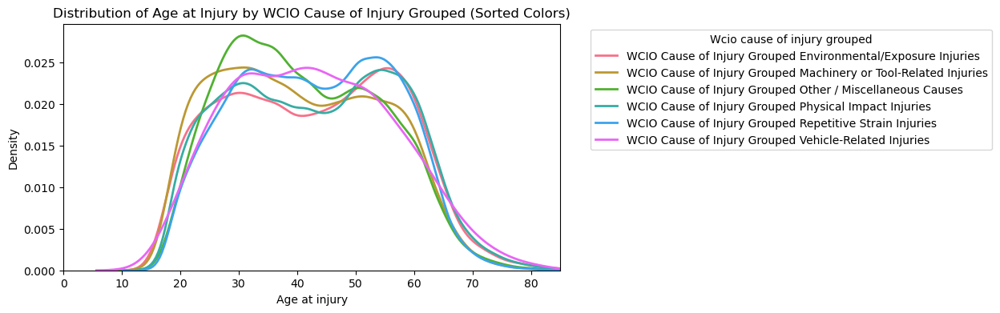

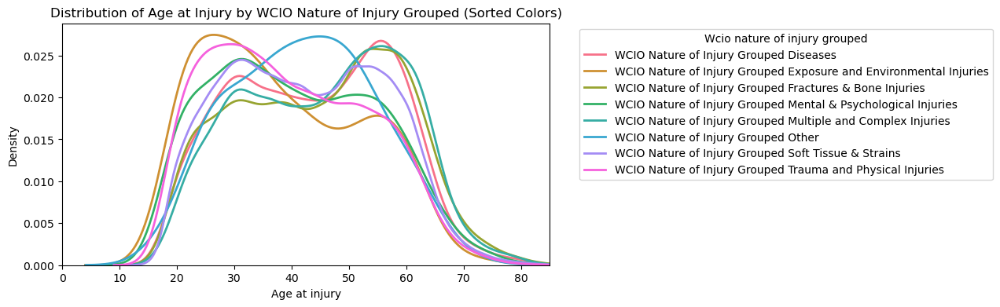

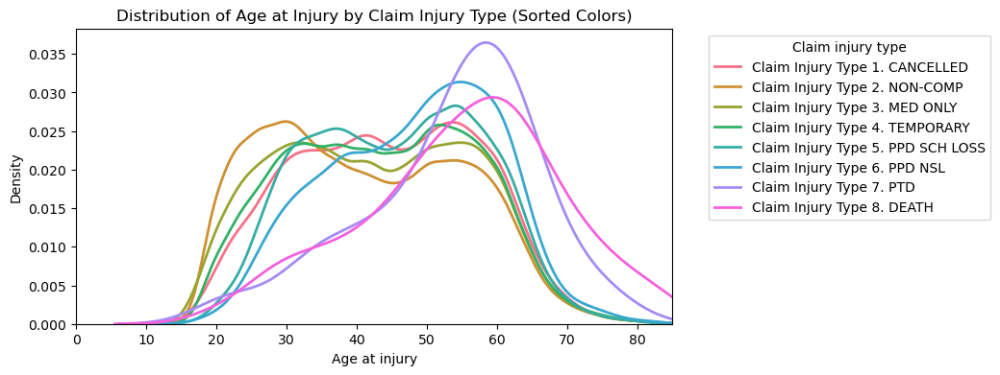

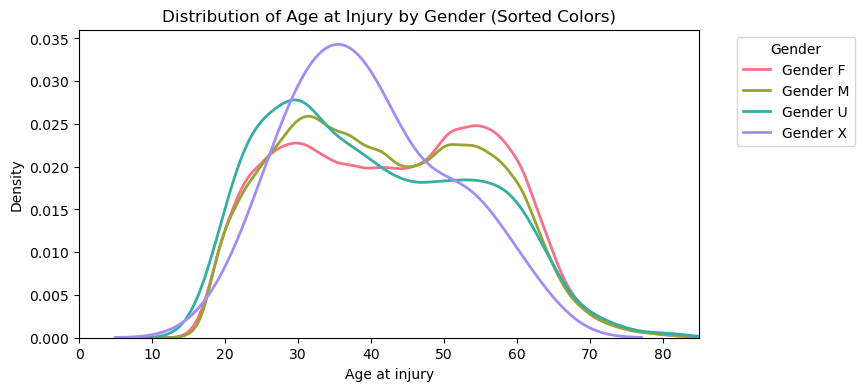

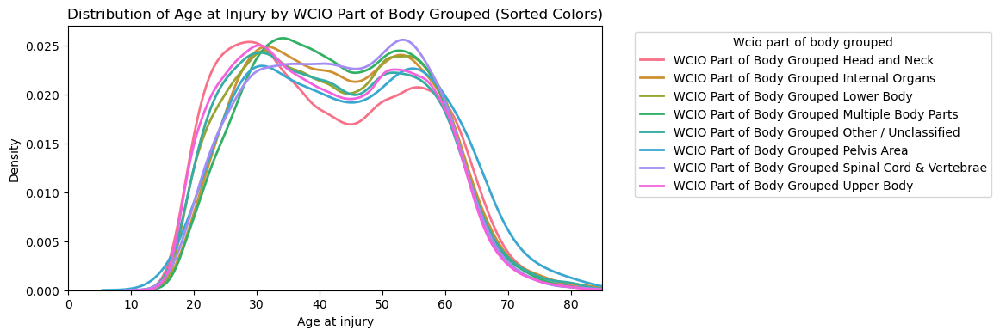

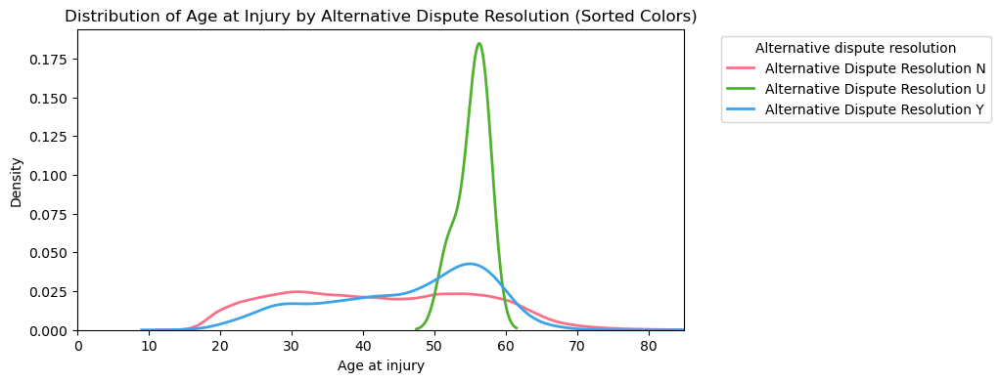

In [45]:
for category in small_category:
        plot_kde_by_category(df_train, 'Age at Injury', category) 

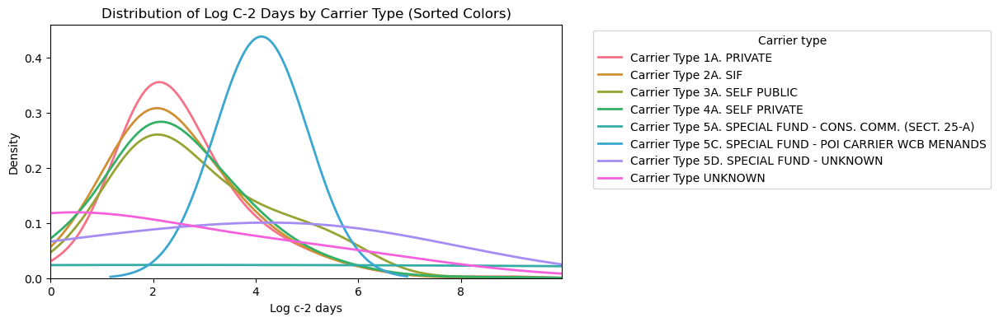

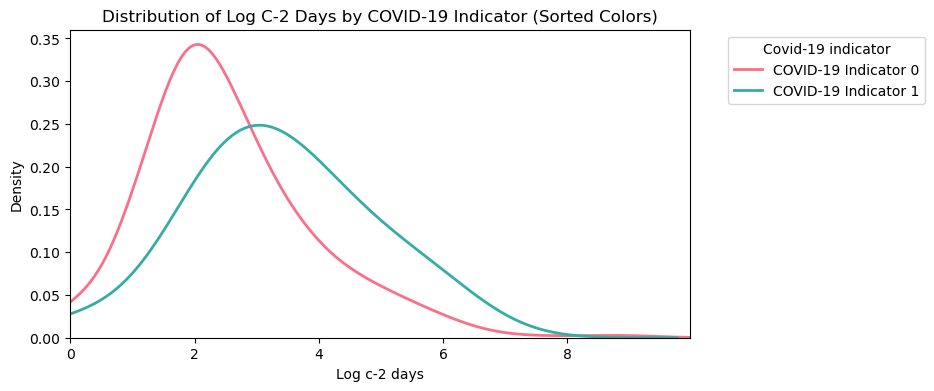

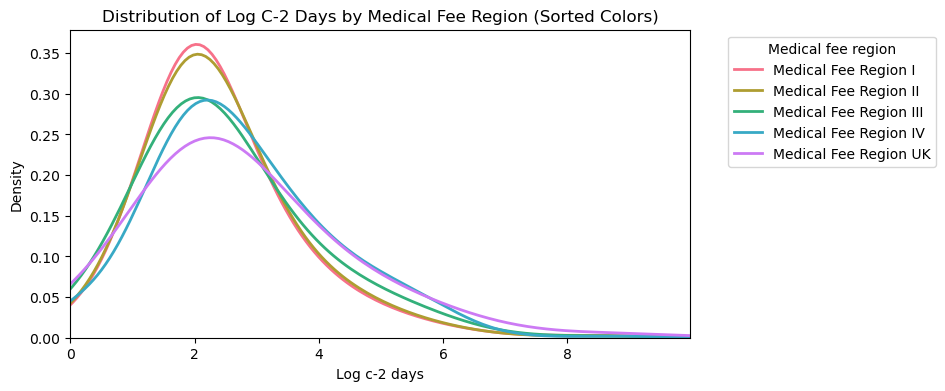

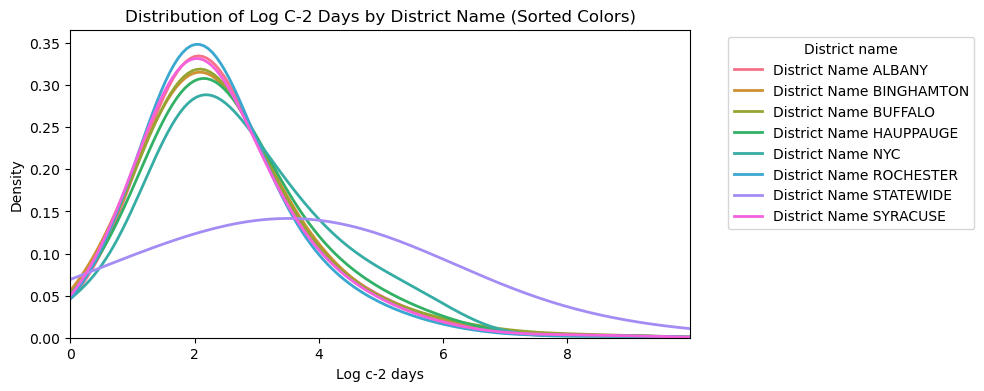

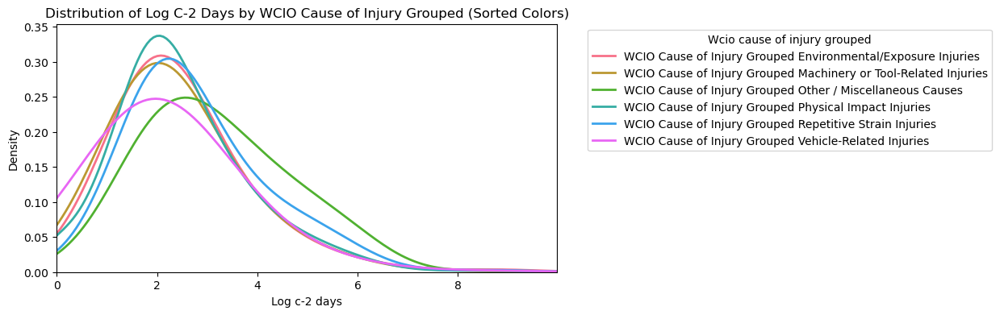

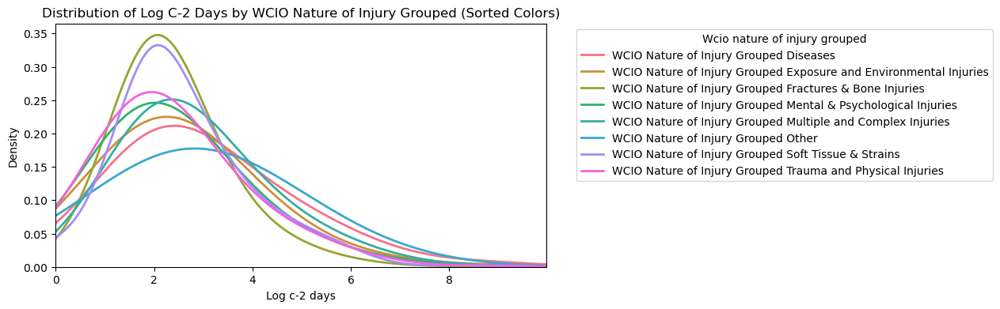

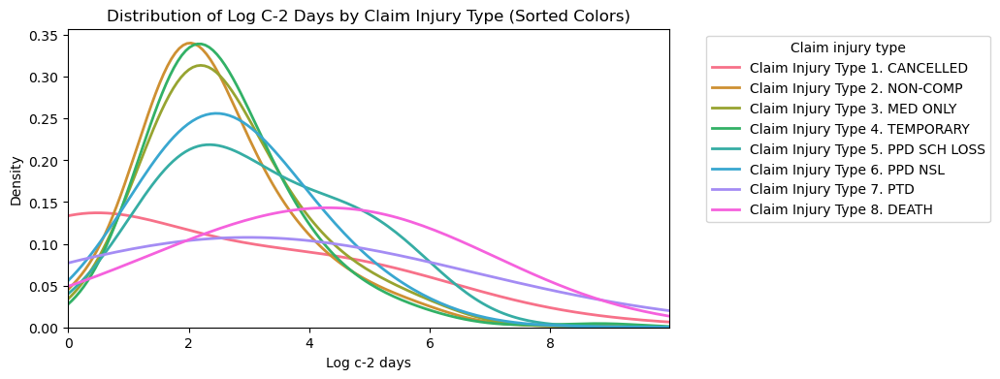

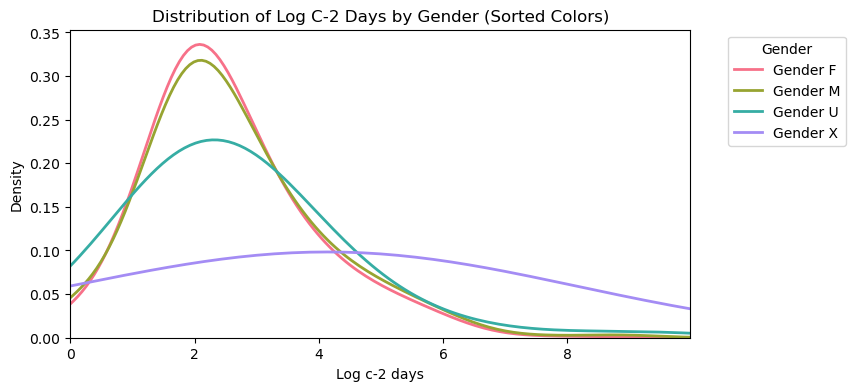

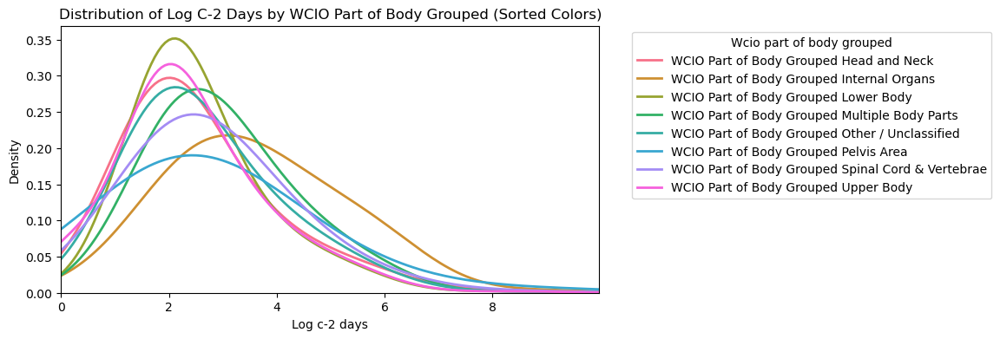

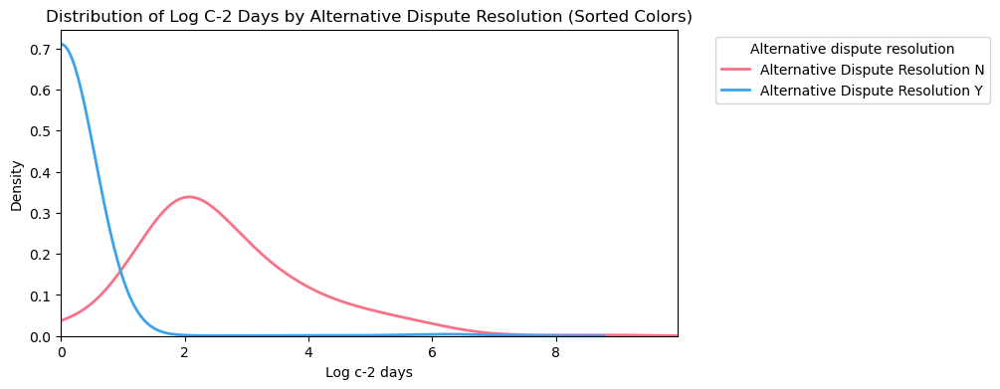

In [46]:
for category in small_category:
        plot_kde_by_category_2(df_train_visuals, 'Log C-2 Days', category,bw_adjust=4.5) 

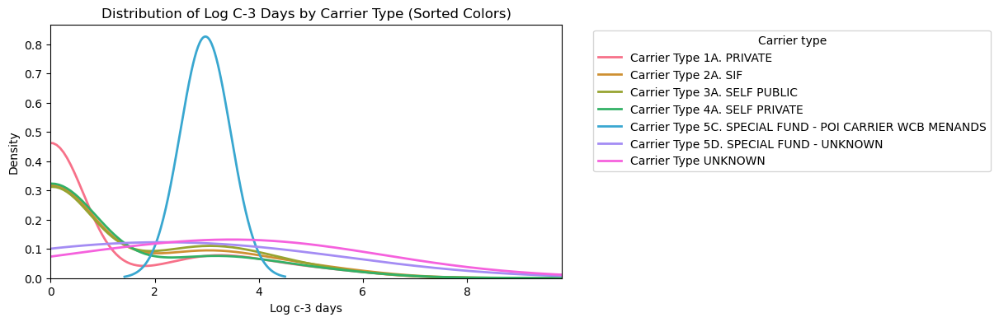

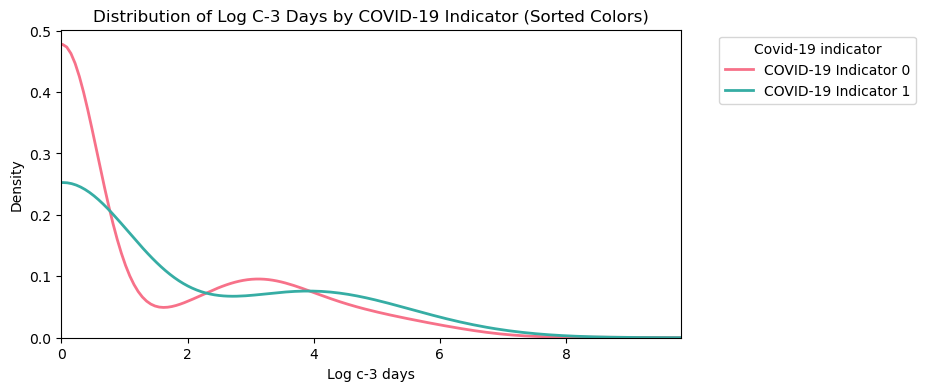

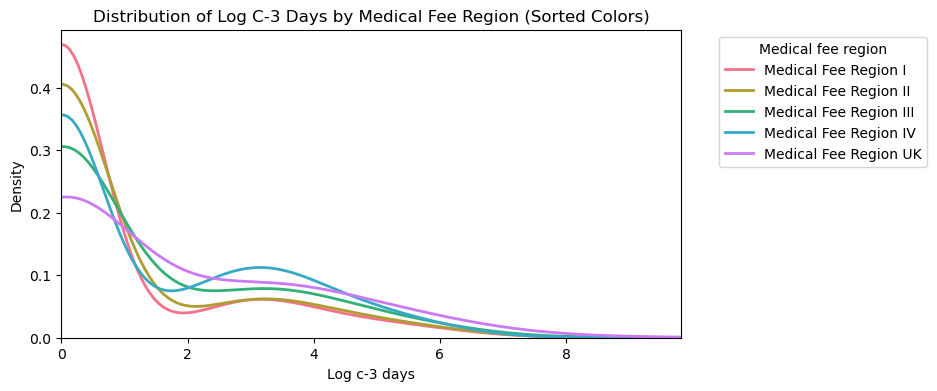

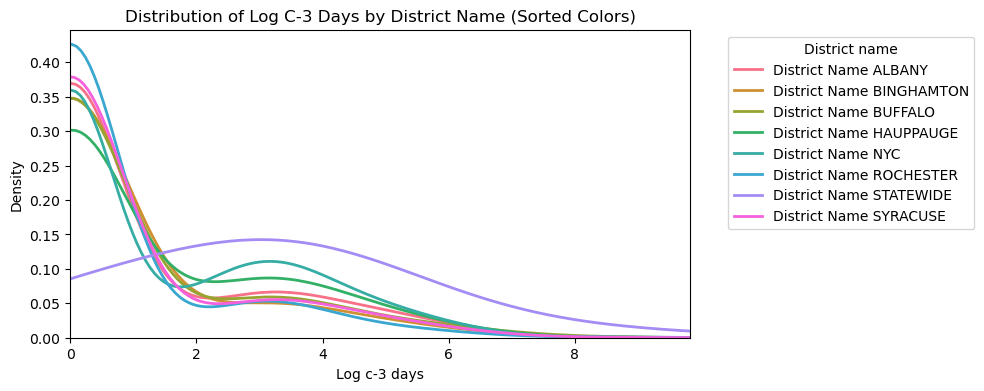

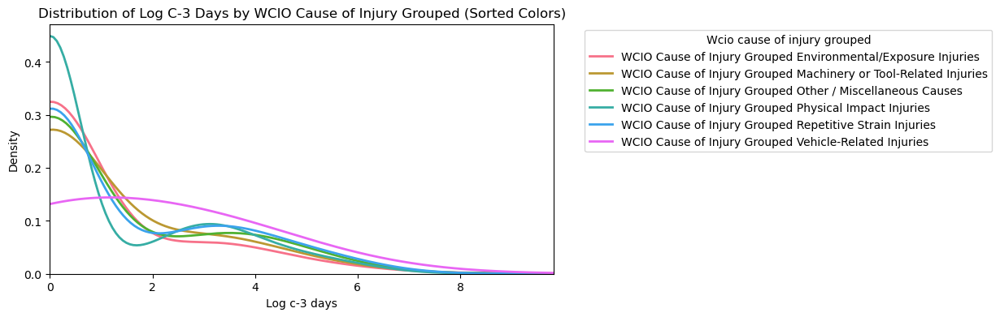

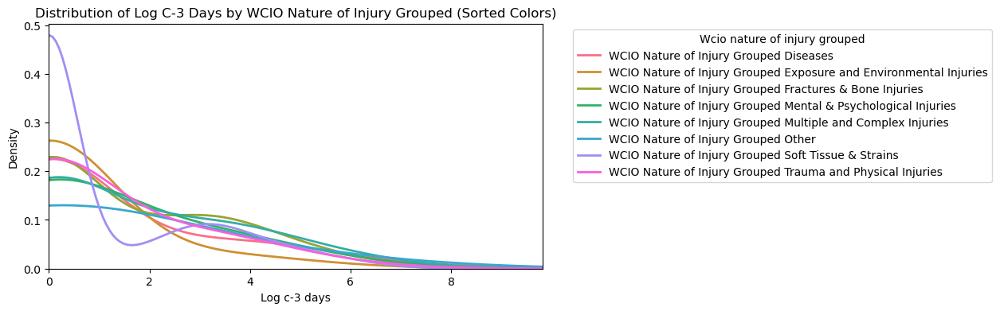

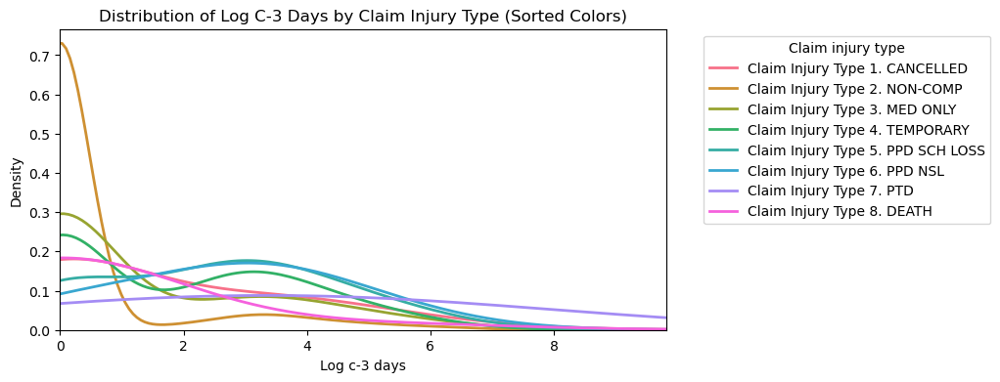

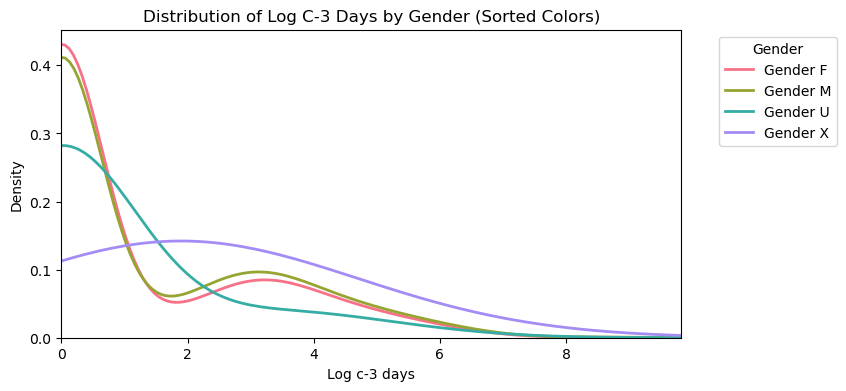

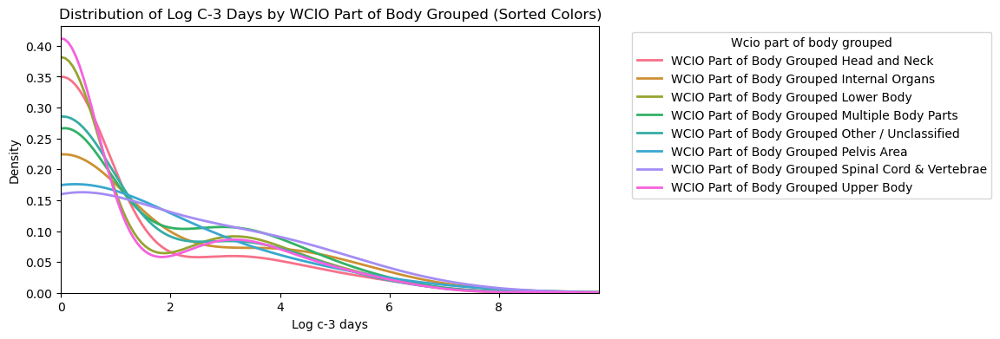

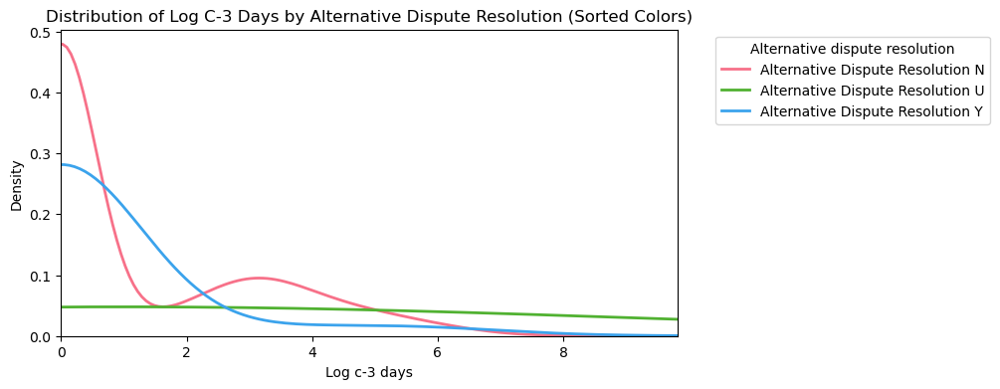

In [47]:
for category in small_category:
        plot_kde_by_category_2(df_train_visuals, 'Log C-3 Days', category,bw_adjust=4.5) 

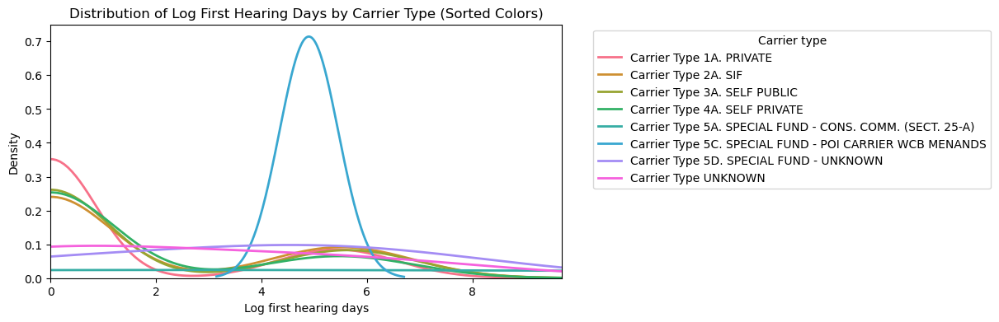

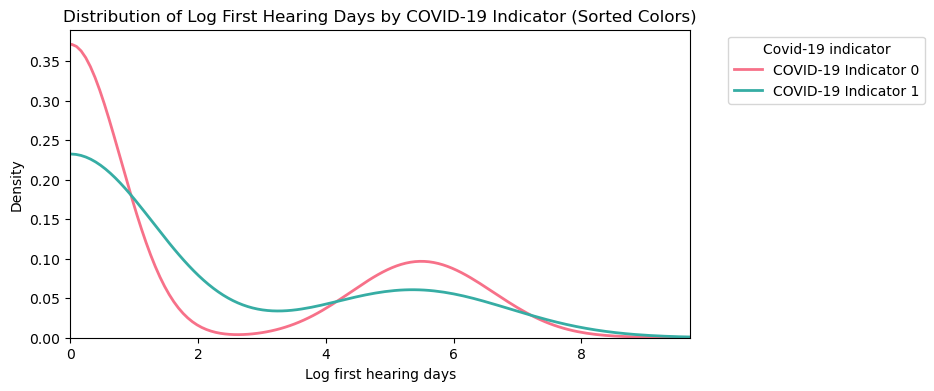

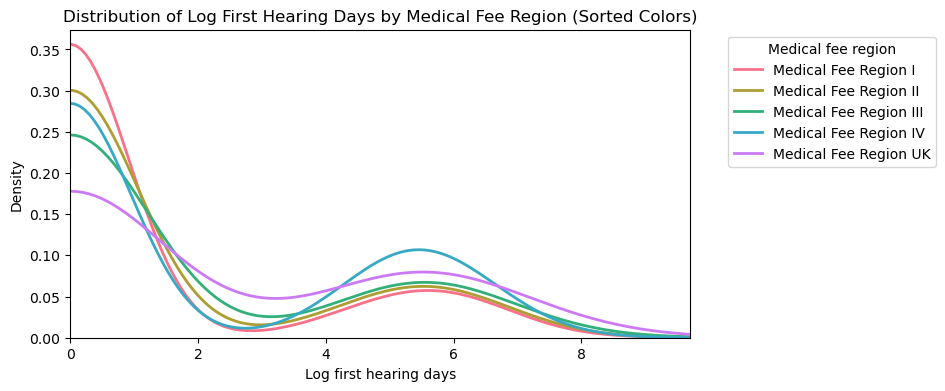

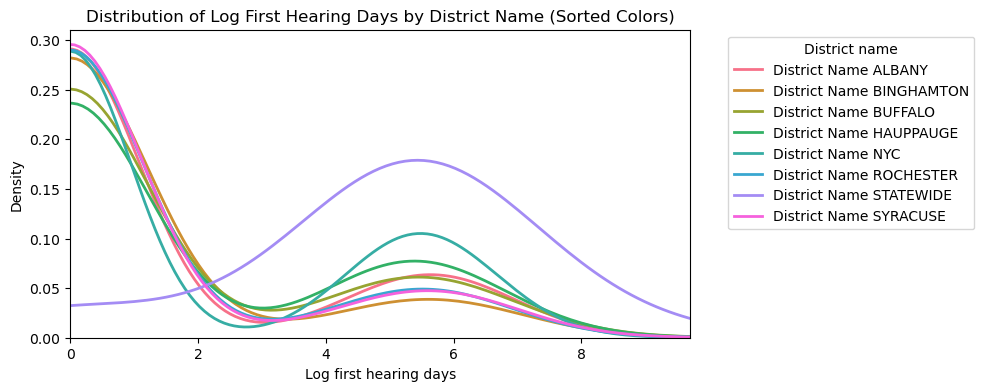

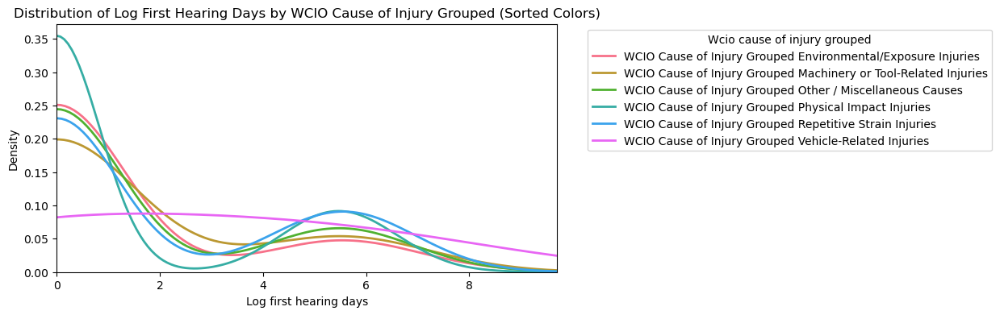

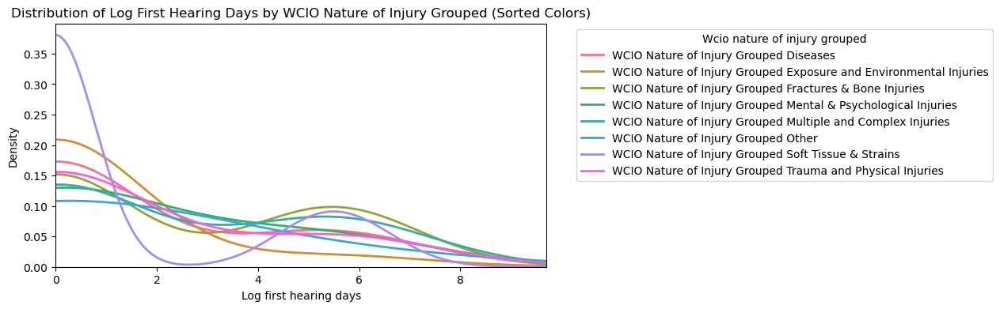

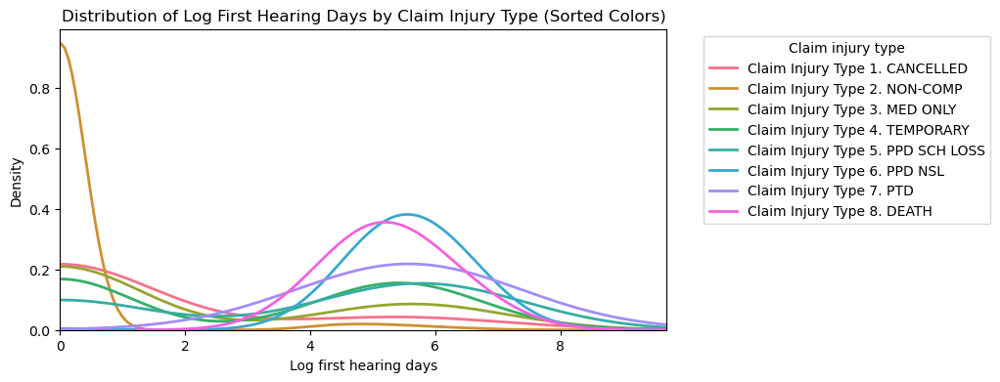

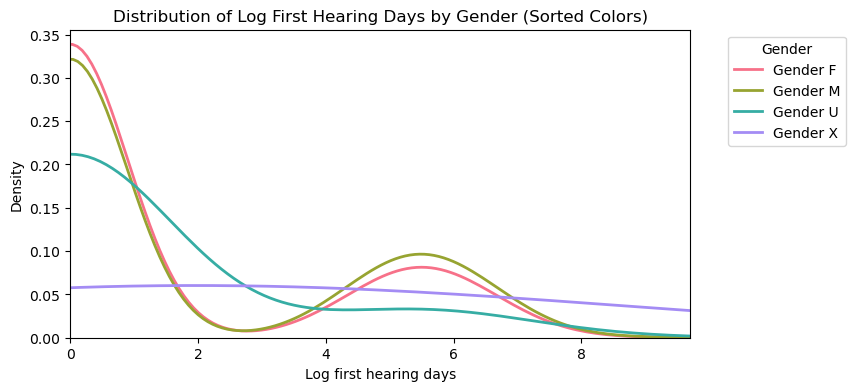

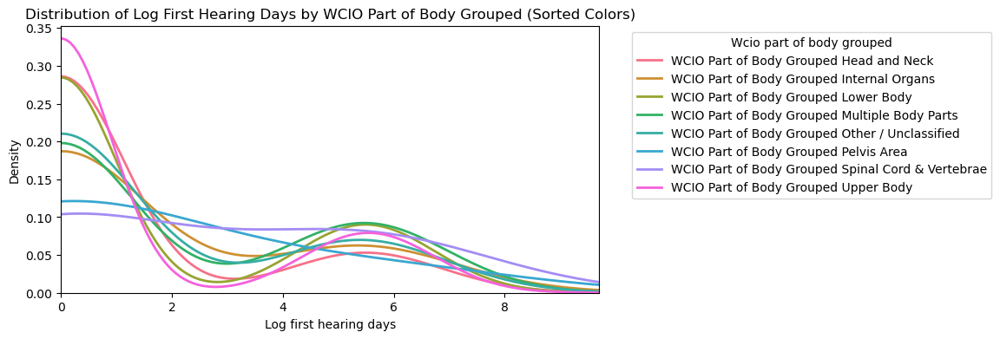

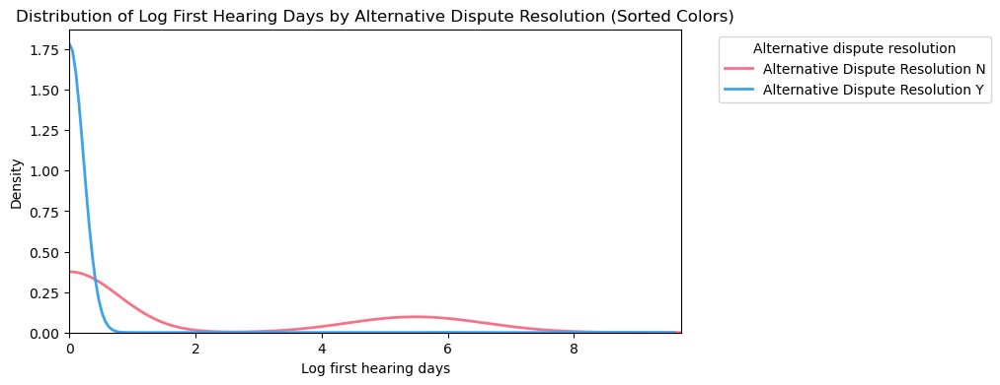

In [48]:
for category in small_category:
        plot_kde_by_category_2(df_train_visuals, 'Log First Hearing Days', category,bw_adjust=4.5) 

<hr>
<a class="anchor" id="categoricalplots">
    
## 2.10.2. Categorical - Categorical - Plots
</a>

In [49]:
small_category.columns

Index(['Carrier Type', 'COVID-19 Indicator', 'Medical Fee Region',
       'District Name', 'WCIO Cause of Injury Grouped',
       'WCIO Nature of Injury Grouped', 'Claim Injury Type', 'Gender',
       'WCIO Part of Body Grouped', 'Alternative Dispute Resolution'],
      dtype='object')

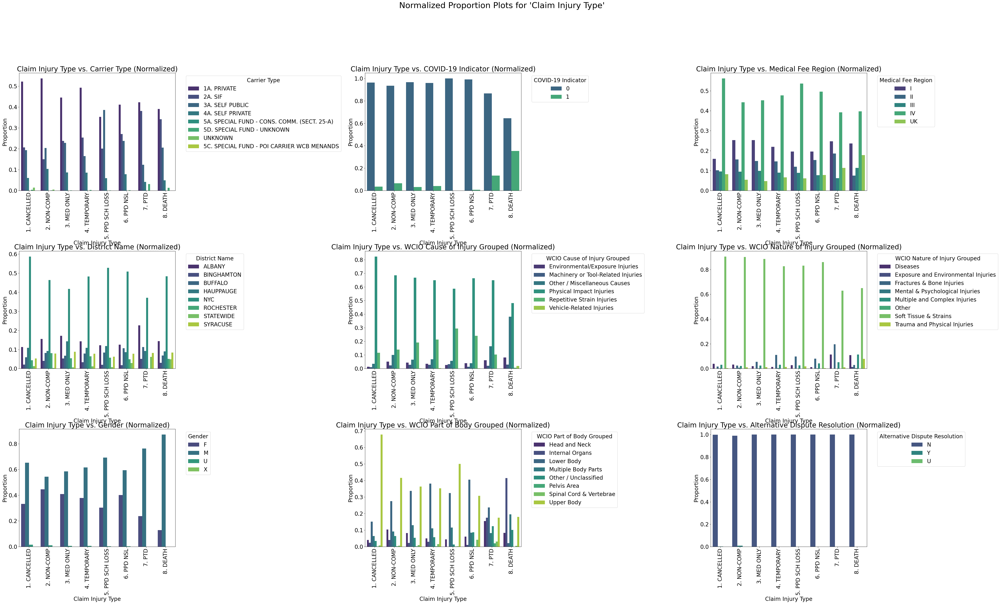

In [50]:
plot_normalized_proportions_all(df_train_visuals, 'Claim Injury Type', small_category, title=None)

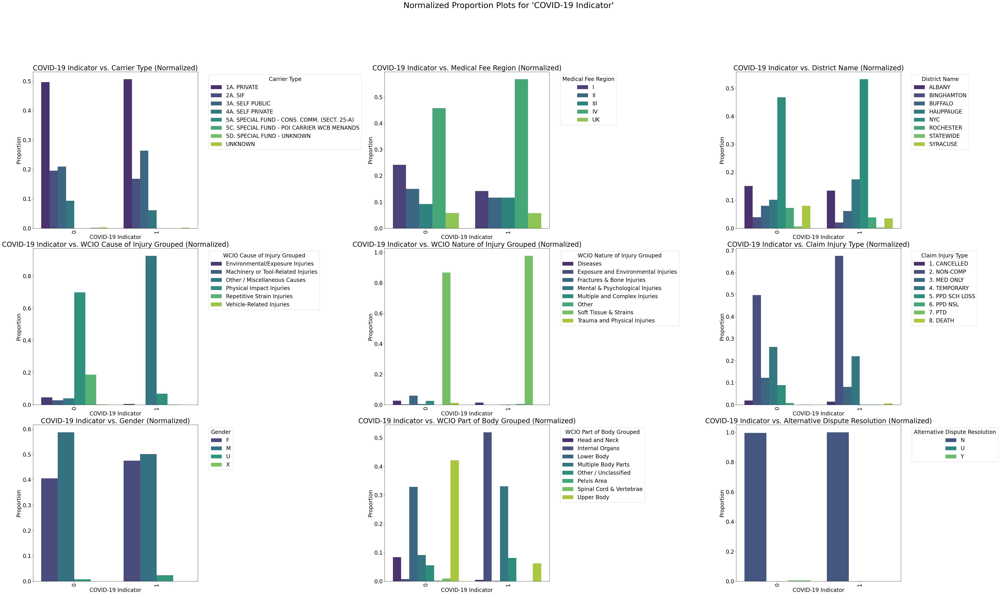

In [51]:
plot_normalized_proportions_all(df_train_visuals, 'COVID-19 Indicator', small_category, title=None)

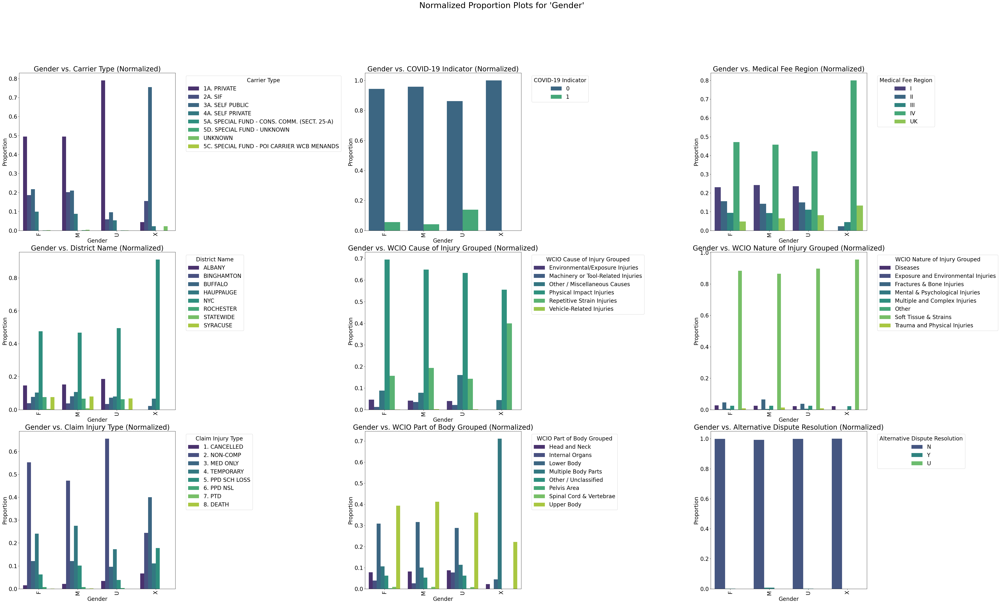

In [52]:
plot_normalized_proportions_all(df_train_visuals, 'Gender', small_category, title=None)

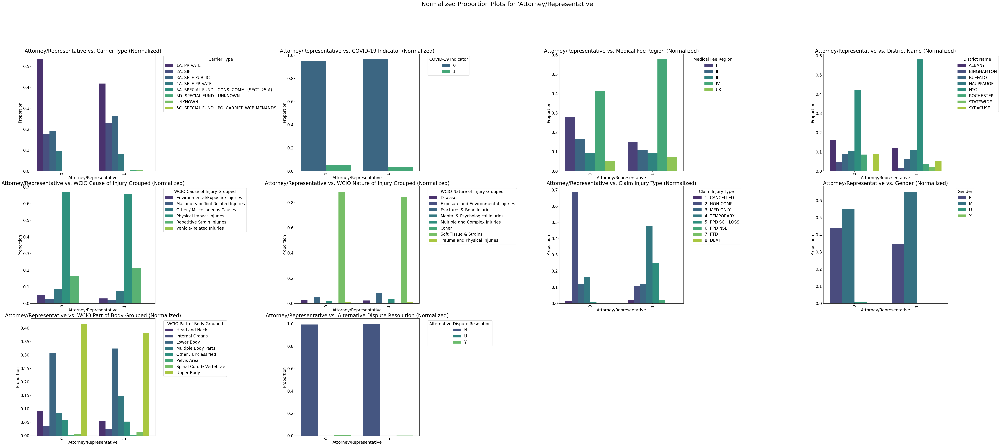

In [53]:
plot_normalized_proportions_all(df_train_visuals, 'Attorney/Representative', small_category, title=None)

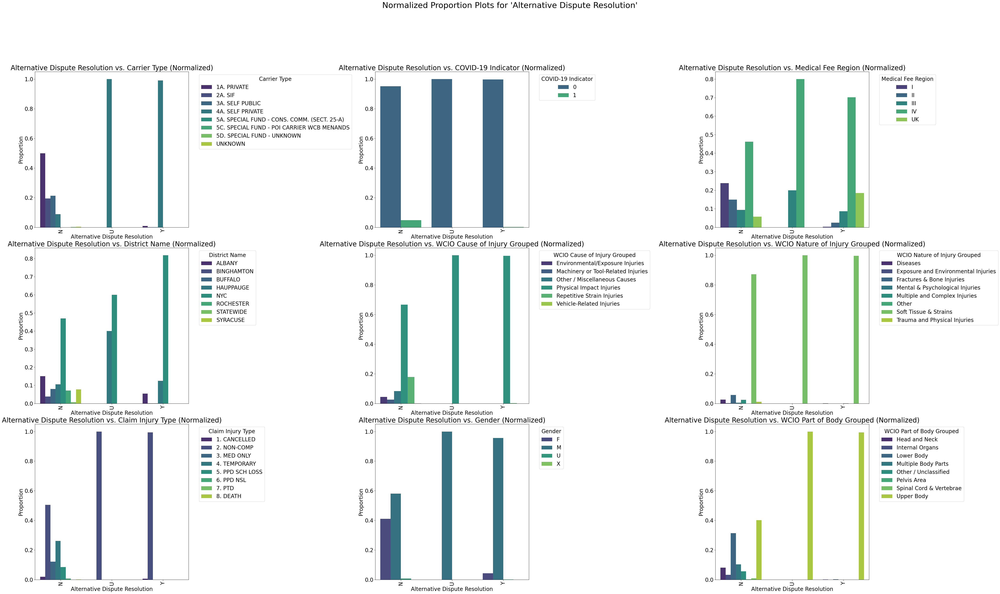

In [54]:
plot_normalized_proportions_all(df_train_visuals, 'Alternative Dispute Resolution', small_category, title=None)

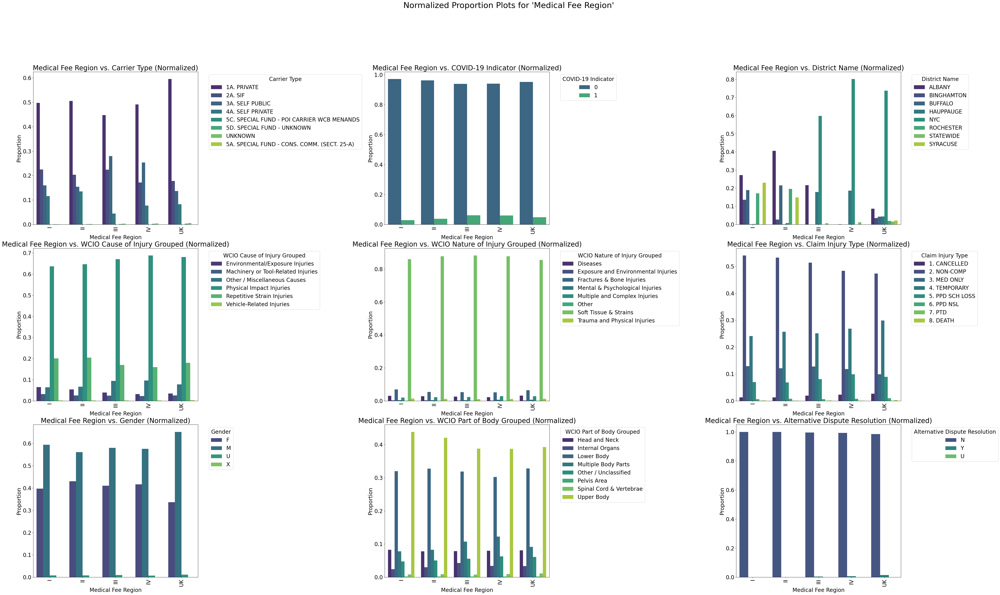

In [55]:
plot_normalized_proportions_all(df_train_visuals, 'Medical Fee Region', small_category, title=None)

<hr>
<a class="anchor" id="numericalplots">
    
## 2.10.3 Numerical - Numerical - Plots
</a>

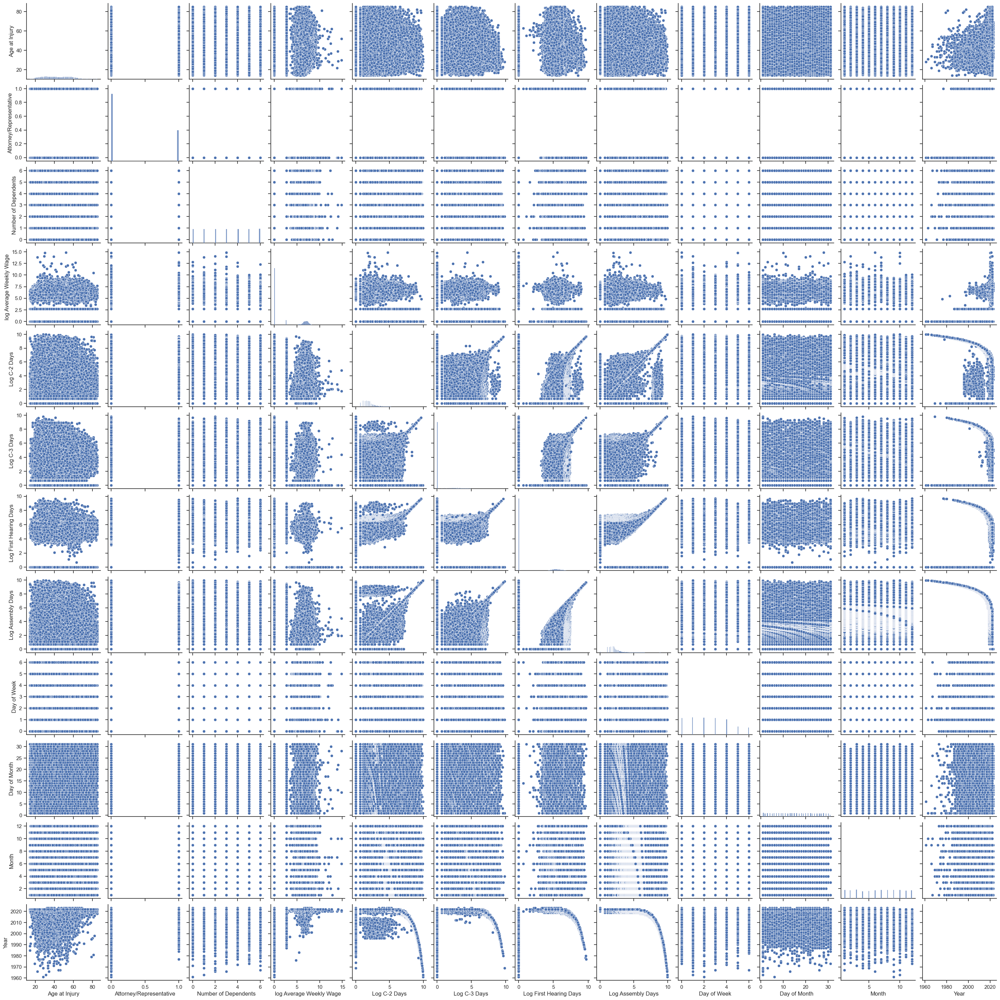

In [56]:
def plot_all_relations(df):
    
    # Creating the pairplot
    sns.set(style="ticks")
    pairplot = sns.pairplot(df)
    
    # Showing the plot
    plt.show()
# Example usage
plot_all_relations(df_train_visuals[feature_types_cleaned['numerical_features']].dropna())

In [57]:
df_train_visuals.columns

Index(['Age at Injury', 'Alternative Dispute Resolution',
       'Attorney/Representative', 'Carrier Name', 'Carrier Type',
       'Claim Injury Type', 'County of Injury', 'COVID-19 Indicator',
       'District Name', 'Gender', 'Industry Code', 'Medical Fee Region',
       'WCIO Cause of Injury Code', 'WCIO Nature of Injury Code',
       'WCIO Part Of Body Code', 'Zip Code', 'Agreement Reached',
       'Number of Dependents', 'Industry Grouped',
       'WCIO Cause of Injury Grouped', 'WCIO Nature of Injury Grouped',
       'WCIO Part of Body Grouped', 'log Average Weekly Wage',
       'C-2 Date Binary', 'Log C-2 Days', 'C-3 Date Binary', 'Log C-3 Days',
       'First Hearing Date Binary', 'Log First Hearing Days',
       'Log Assembly Days', 'Day of Week', 'Day of Month', 'Month', 'Year',
       'IME-4 Count Binary nan'],
      dtype='object')

## 2.10.4 Variables vs. target


We should analyze how the variables behave across different claim types, as Claim Injury Type is the main variable we aim to predict

In [ ]:
# Define the target variable
target_column = 'Claim Injury Type'

# Define a custom color palette for 8 categories
custom_palette = ['#ff9999', '#66b3ff', '#99ff99', '#ffcc99', '#c2c2f0', '#ffb3e6', '#c2f0c2', '#ff6666']

# Plot numerical variables in box plots categorized by the target variable
fig, axes = plt.subplots(3, ceil(len(numerical_features) / 3), figsize=(20, 11), constrained_layout=True)

# Plotting the data
for ax, feature in zip(axes.flatten(), numerical_features):
    sns.boxplot(
        y=target_column,
        x=feature,
        data=df_train,
        ax=ax,
        palette=custom_palette,
        orient='h'
    )
    ax.set_ylabel('')  # Remove the y-axis label for cleaner layout

# Layout
plt.suptitle('Numerical Variables - Box Plots by Claim Injury Type', y=1.02, fontsize=16)
plt.show()

From the boxplots, several features are associated with `Claim Injury Type`. **Age at Injury** stands out, with older individuals strongly linked to severe claims like `DEATH` and `PTD`. Features like **Log C-2 Days**, **Log C-3 Days**, **Log First Hearing Days**, and **Log Assembly Days** show longer durations for severe claims, reflecting their procedural complexity. However, **Log Assembly Days** demonstrates only moderate correlation with the target due to overlaps between some categories. Meanwhile, **IME-4 Count Binary** is primarily concentrated in the `TEMPORARY` category, with limited variation, suggesting it is not a strong predictor. Based on the boxplots, **Age at Injury** and the processing time features (e.g., **Log C-2 Days**, **Log C-3 Days**) appear to be the most valuable for predicting the target.


In [ ]:
# Define a custom color palette for 8 categories
custom_palette = ['#ff9999', '#66b3ff', '#99ff99', '#ffcc99', '#c2c2f0', '#ffb3e6', '#c2f0c2', '#ff6666']

# Plot numerical variables in histograms categorized by the target variable
fig, axes = plt.subplots(2, ceil(len(numerical_features) / 2), figsize=(20, 12))

# Plotting the data
for ax, feature in zip(axes.flatten(), numerical_features):
    sns.histplot(
        ax=ax,
        data=df_train,
        x=feature,
        hue=target_column,
        bins=10,
        palette=custom_palette,
        multiple="stack",
        kde=False,
        legend=False  # Disable individual legends
    )
    ax.set(ylabel=None)  # Remove the y-axis label for a cleaner layout

# Add a single legend on the right side
# Get unique labels and colors directly from the target variable
handles = [plt.Line2D([0], [0], color=color, lw=5) for color in custom_palette]
labels = df_train[target_column].unique()

fig.legend(
    handles,
    labels,
    title="Claim Injury Type",
    bbox_to_anchor=(1.02, 0.5),  # Position legend on the right side
    loc="center",
    frameon=False,  # Optional: remove legend border
    fontsize=12,
    title_fontsize=13
)

# Adjust layout to make space for the legend
fig.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust right padding
title = 'Numerical Variables - Histograms by Claim Injury Type'
plt.suptitle(title, y=1.02, fontsize=16)
plt.show()



In [ ]:

# Enhanced pairplot with customized visuals
sns.pairplot(
    df_train, 
    vars=numerical_features, 
    hue=target_column, 
    diag_kind="hist", 
    palette='tab10',  # A visually distinctive palette
    markers=['o', 's', 'D', '^', 'P', 'X', '*', 'h'],  # Different markers for each category
    height=2.5,  # Smaller plots for better readability in larger grids
    aspect=1.2   # Adjust aspect ratio for wider plots
)

# Add a centered title
plt.suptitle("Pairwise Relationships of Numerical Variables by Claim Type", y=1.02, fontsize=14)
plt.show()


In [ ]:
custom_palette = ['#ff9999', '#66b3ff', '#99ff99', '#ffcc99', '#c2c2f0', '#ffb3e6', '#c2f0c2', '#ff6666']

# Function to plot easier-to-read bar charts for categorical variables
def plot_categorical_features(df, categorical_features, target_column, top_n=None):
    for feature in categorical_features:
        # Aggregate categories if needed
        if top_n:
            top_categories = df[feature].value_counts().head(top_n).index
            df[feature] = df[feature].apply(lambda x: x if x in top_categories else 'Other')
        
        # Plot horizontal bar chart
        plt.figure(figsize=(12, 8))
        sns.countplot(
            y=feature, 
            hue=target_column, 
            data=df, 
            palette=custom_palette
        )
        plt.title(f'{feature} - Absolute Frequencies by {target_column}')
        plt.xlabel('Count')
        plt.ylabel(feature)
        plt.legend(title=target_column, bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.tight_layout()
        plt.show()

# Example usage
plot_categorical_features(df_train, categorical_features, target_column, top_n=10)

From the bar plots, several categorical features are associated with the target variable. **WCIO Nature of Injury Grouped**, **Industry Code**, **District Name**, and **WCIO Cause of Injury Grouped** show strong correlations with the target, as they effectively differentiate between severe and non-severe claims. For example, severe claims like `DEATH` and `PTD` are linked to categories such as `Fractures & Bone Injuries` or specific industries like `62.0`. 

On the other hand, features like **Zip Code** and **Carrier Name** show limited variation across claim types, making them less predictive of claim severity.
